<h1 style = "font-family: Arial, sans-serif; text-align: center;"><b>The Annoted AlexNet</b> </h1>



<h2 style="font-family: Arial, sans-serif; color: black;text-align: center;">
    <a href="https://proceedings.neurips.cc/paper/4824-imagenet-classification-with-deep-convolutional-neural-networks.pdf " target="_blank" style="text-decoration: none; color: black;">
        <b>ImageNet Classification with Deep Convolutional Neural Networks</b>
    </a>
</h2>

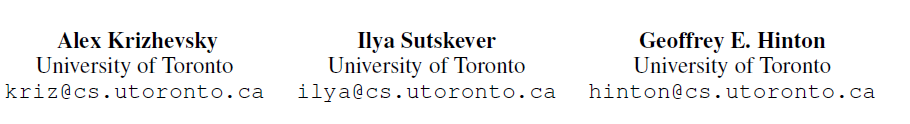

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">This documentation provides a detailed annotation of the AlexNet architecture, explaining the purpose and functionality of each layer, the role of hyperparameters, and how the network contributes to efficient feature extraction and classification tasks.</p>



<div style="font-family: Arial, sans-serif; padding: 20px; font-size: 16px; line-height: 1.6;">
    <h3>Table of Contents</h3>
    <ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; text-align: justify;">
        <li><a href="#Prelims" style="color: black; text-decoration: none;"><strong>Prelims</strong></a></li>
        <li><a href="#Background" style="color: black; text-decoration: none;"><strong>Background</strong></a></li>
        <li><a href="#Motivation" style="color: black; text-decoration: none;"><strong>Motivation</strong></a></li>
        <li><a href="#Key_Breakthroughs" style="color: black; text-decoration: none;"><strong>Key Breakthroughs</strong></a></li>
        <li><a href="#ImageNet_Dataset" style="color: black; text-decoration: none;"><strong>ImageNet Dataset</strong></a></li>
        <li><a href="#Model_Architecture" style="color: black; text-decoration: none;"><strong>Part 1: Model Architecture</strong></a>
            <ul>
                <li><a href="#Architectural_Breakdown" style="color: black; text-decoration: none;"><strong>Key component of architecture</strong></a>
                    <ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; text-align: justify;">
                        <li><a href="#Data_Augmentation" style="color: black; text-decoration: none;">Data Augmentation</a></li>
                        <li><a href="#ReLU" style="color: black; text-decoration: none;">ReLU</a></li>
                        <li><a href="#Conv2D" style="color: black; text-decoration: none;">Conv2D</a></li>
                        <li><a href="#MaxPooling" style="color: black; text-decoration: none;">MaxPooling</a></li>
                        <li><a href="#Feed_Forward_Network" style="color: black; text-decoration: none;">Feed Forward Neural Network</a></li>
                        <li><a href="#Local_Response_Normalization" style="color: black; text-decoration: none;">Local Response Normalization</a></li>
                        <li><a href="#DropOut" style="color: black; text-decoration: none;">DropOut</a></li>
                    </ul>
                </li>
                <li><a href="#AlexNet_Architecture" style="color: black; text-decoration: none;"><strong>AlexNet Architecture</strong></a></li>
            </ul>
        </li>
        <li><a href="#Model_Training" style="color: black; text-decoration: none;"><strong>Part 2: Model Training</strong></a>
            <ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; text-align: justify;">
                <li><a href="#Batch_Size" style="color: black; text-decoration: none;">Batch Size</a></li>
                <li><a href="#Training_AlexNet" style="color: black; text-decoration: none;">Defining the model - AlexNet</a></li>
                <li><a href="#SGD_Optimizer" style="color: black; text-decoration: none;">SGD Optimizer and Learning Rate Scheduler</a></li>
                <li><a href="#Training_the_Model " style="color: black; text-decoration: none;">Training the Model</a></li>
            </ul>
        </li>
        <li><a href="#Real_World_Example" style="color: black; text-decoration: none;"><strong>Part 3: A Real World Example</strong></a>
            <ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; text-align: justify;">
                <li><a href="#Data_Loading" style="color: black; text-decoration: none;">Data Loading</a></li>
                <li><a href="#Data_Augumentation_data" style="color: black; text-decoration: none;">Data Augumentation on Dataset</a></li>
                <li><a href="#Training_System" style="color: black; text-decoration: none;">AlexNet Model</a></li>
                <li><a href="#Training_the_model" style="color: black; text-decoration: none;">Training the Model</a></li>
                <li><a href="#Model_checking" style="color: black; text-decoration: none;">Model checking</a></li>
                <li><a href="#Evaluation" style="color: black; text-decoration: none;">Evaluation</a></li>
            </ul>
        </li>
        <li><a href="#Conclusion" style="color: black; text-decoration: none;"><strong>Discussion</strong></a></li>
        <ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; text-align: justify;">
                <li><a href="#Observations" style="color: black; text-decoration: none;">Observations</a></li>
                <li><a href="#Weakness" style="color: black; text-decoration: none;">AlexNet Limitations</a></li>
            </ul>
    </ul>
</div>





<a id="Prelims" style="color: black; text-decoration: none;"><h1>Prelims</h1></a>


#### Importing Required libraries

In [26]:
# Python libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Importing tensorflow libraries
import tensorflow as tf
from tensorflow import keras

# Graph Visualization
import pydot
import graphviz

import warnings
warnings.filterwarnings("ignore")

<a id="Prelims" style="color: black; text-decoration: none;"><h1>Background</h1></a>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"> AlexNet is an image classification model that made a big impact on deep learning. It was developed by Geoffrey Hinton and his team in 2012, and it played a crucial role in demonstrating the power of CNN (Convolutional Neural Network) architectures for large-scale applications. Before AlexNet, people were skeptical about whether deep learning could be applied successfully to very large image datasets. However, a group of researchers were determined to show that deep neural networks were the way forward. Their success with AlexNet greatly increased interest in deep learning after 2012.
Hence, AlexNet was born out of the need to improve the results of the ImageNet challenge. This was one of the first Deep convolutional networks to achieve considerable accuracy on the 2012 ImageNet LSVRC-2012 challenge.It did much better than the second-place model by lowering the top-5 error rate from 26.2% to 15.3%. The idea of spatial correlation in an image frame was explored using convolutional layers and receptive fields. Thus, ImageNet was also crucial for the advancement of Deep Learning. </p>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"> Hence, AlexNet was born out of the need to improve the results of the ImageNet challenge. This was one of the first Deep convolutional networks to achieve considerable accuracy on the 2012 ImageNet LSVRC-2012 challenge.It did much better than the second-place model by lowering the top-5 error rate from 26.2% to 15.3%. The idea of spatial correlation in an image frame was explored using convolutional layers and receptive fields. Thus, ImageNet was also crucial for the advancement of Deep Learning. </p>

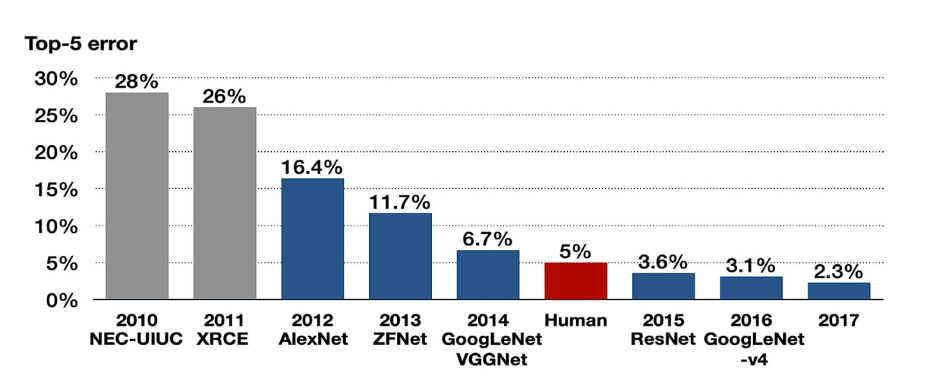
<center>
    <figcaption><b>Figure 1: Comparison of top-5 error rates in image classification models from 2010 to 2017.</b></figcaption>
</center>




<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"> Before AlexNet, computer vision was mostly dominated by techniques like Support Vector Machines (SVMs) and simple neural networks because training deeper models with millions of parameters seemed unachievable. Let's explore why this was the case and the challenges faced by earlier machine learning models.</p>


<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
        <li><b>Machine Learning Models:</b>Before AlexNet, the machine learning models used had to balance the capacity to learn from vast amounts of data with the computational feasibility of training. CNNs emerged as a promising class of models because of their ability to incorporate strong and mostly correct assumptions about images, such as the stationarity of statistics and locality of pixel dependencies.</li>
        <li><b>Feature Engineering:</b> SVMs and basic neural networks needed a lot of manual feature engineering, which made it hard for these models to scale up or generalize well across different scenarios.</li>
        <li><b>Computational Resources:</b> Researchers typically used CPUs to train models before AlexNet, as they didn't have access to GPU processing. This change occurred when Nvidia introduced the CUDA API, which allowed AI applications to utilize GPUs for parallel processing.</li>
        <li><b>Vanishing Gradient Problem:</b> Deep networks often encountered the vanishing gradient problem during training, where gradients shrink and effectively disappear, making it hard to optimize the network.</li>
</ul>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Due to these challenges, such as limited computational power, the vanishing gradient issue, and the absence of large training datasets, most neural networks were shallow, limiting their ability to generalize well. </p>



<a id="Prelims" style="color: black; text-decoration: none;"><h1>Motivation</h1></a>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">The primary motivation behind AlexNet and the research paper stems from the need to significantly improve the accuracy of image classification systems, particularly in the context of the ImageNet Large Scale Visual Recognition Challenge (ILSVRC). Before AlexNet, traditional image classifiers struggled with high variability in images due to factors like different object positions, sizes, and environments which lead to poor generalization on large-scale image datasets. The ImageNet dataset, which includes over 15 million labeled high-resolution images in over 22,000 categories, which previous models based on shallow learning architectures and handcrafted features were not able to handle effectively.</p>

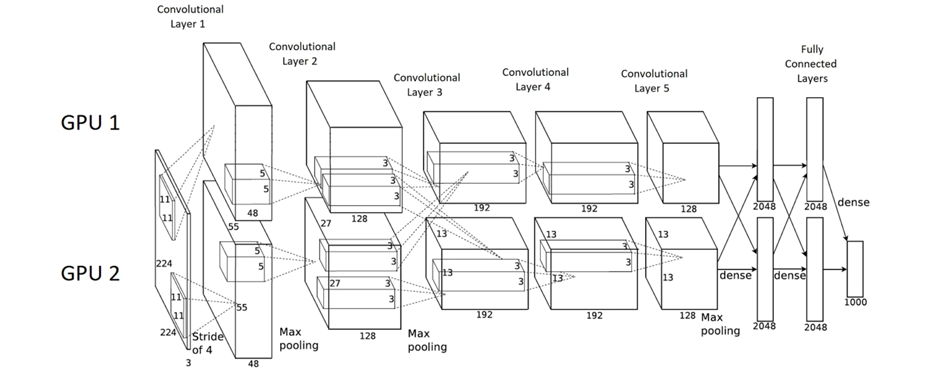
<center>
    <figcaption><b>Figure 2: AlexNet Architecture using two GPUs.</b></figcaption>
</center>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"> The problems this paper sought to address included:</p>



<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
        <li><b>Handling High Dimensionality:</b> Effective handling of the vast number of categories and the subtle inter-class variations in ImageNet required a model with substantial capacity to extract and learn a complex hierarchy of features.</li>
        <li><b>Computational Efficiency:</b> Previous models were not only less effective but also computationally expensive and time-consuming to train, which was impractical for datasets as large as ImageNet.</li>
        <li><b>Overfitting:</b> The complexity and depth necessary for such a model increased the risk of overfitting, where the model performs well on training data but poorly on unseen test data.</li>
</ul>




<a id="Key_Breakthroughs" style="color: black; text-decoration: none;"><h1>Key Breakthroughs</h1></a>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">This AlexNet paper introduced several key innovations that enabled it to resolve these problems effectively, marking significant breakthroughs in the field of deep learning for image classification:</p>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"> The problems this paper sought to address included:</p>


<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li><b>Deep Convolutional Neural Network Architecture:</b> AlexNet featured a deep architecture with five convolutional layers followed by three fully connected layers. This depth was crucial for learning complex feature hierarchies directly from the data, which was a significant shift from the shallower architectures used previously.</li>
    <li><b>GPU Computing:</b> AlexNet was one of the first to harness the power of GPU computing to train deep networks, specifically using two GTX 580 GPUs to manage the immense computational workload. This approach was innovative at the time and critical for reducing training times from weeks to just days.</li>
    <li><b>Rectified Linear Units (ReLUs): </b> Before AlexNet, sigmoid and tanh were the most common activation functions used in neural networks. These functions tend to saturate, leading to a problem known as the Vanishing Gradient (VG), which makes training networks difficult. In contrast, AlexNet introduced the ReLU activation function, which doesn't have the VG problem. This paper demonstrates that networks using ReLU reached a 25% error rate approximately six times faster than those using tanh. AlexNet was one of the first to use ReLU activation functions instead of traditional tanh or sigmoid. ReLUs help in speeding up the training process significantly, as they do not saturate in the positive domain and mitigate the vanishing gradient problem, allowing deeper networks to be trained more effectively.While ReLU helps avoid the vanishing gradient issue, its unbounded nature can cause the learned parameters to grow too large. To address this, AlexNet implemented Local Response Normalization (LRN). LRN normalizes the outputs across nearby groups of neurons, enhancing the response of active neurons while suppressing others nearby, maintaining a balance in learned values.</li>
     <li><b>Local Response Normalization (LRN):</b>AlexNet employed LRN to improve the accuracy and robustness of the network, simulating a form of lateral inhibition found in real neurons, which encourages competition among adjacent neurons and enhances generalization. Although later practices found LRN to be less impactful than initially thought, at the time, LRN helped in improving generalization.</li>
      <li><b>Overlapping Pooling:</b> Instead of the traditional non-overlapping pooling, AlexNet introduced overlapping max-pooling, where pooling windows overlap each other, reducing the size of the output from one layer to the next and decreasing the error rate by making the network less sensitive to small shifts and distortions in the image. Overlapping pooling was less prone to overfitting compared to non-overlapping pooling, likely because it provides a form of continuous subsampling. This overlapping improved the top-1 and top-5 errors by 0.4% and 0.3%, respectively.</li>
      <li><b>Data Augmentation Techniques:</b> To combat overfitting due to the relatively small size of the training set compared to the network's complexity, AlexNet implemented extensive data augmentation techniques. This Data augmentation includes mirroring, cropping the images and changes to the intensities of RGB channels, effectively increasing the dataset size by a factor of 2048.</li>
</ul>


<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">These innovations combined made AlexNet particularly effective, enabling it to outperform other models by a significant margin in the ImageNet competition and lowering the top 5 error rate dramatically to 17.0% compared to previous state-of-the-art technologies, significantly outperforming the second-best entry at the time, which had an error rate of 26.2%. This breakthrough demonstrated the potential of deep convolutional neural networks in image recognition tasks, setting a new standard in the field and inspiring subsequent research and advancements.</p>

<a id="ImageNet_Dataset" style="color: black; text-decoration: none;"><h1>ImageNet Dataset</h1></a>

<style>
    img {
        max-width: 40%; /* Ensures responsiveness */
        height: auto;   /* Maintains aspect ratio */
    }
</style>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">ImageNet is a vast dataset with over 15 million high-resolution images categorized into approximately 22,000 categories. These images were sourced from the internet and labeled by people using Amazon’s Mechanical Turk. Since 2010, an annual competition known as the ImageNet Large-Scale Visual Recognition Challenge (ILSVRC) has been part of the Pascal Visual Object Challenge. The competition is significant as it encourages researchers to test the boundaries of current models and develop new approaches. Many pioneering models, including AlexNet, have emerged from this competition. ILSVRC uses a smaller portion of ImageNet, with about 1,000 images in each of 1,000 categories, totaling around 1.2 million training images, 50,000 validation images, and 150,000 testing images. The 2010 version of ILSVRC is unique because it’s the only version with available test set labels, which is why most experiments were performed on it.</p> 

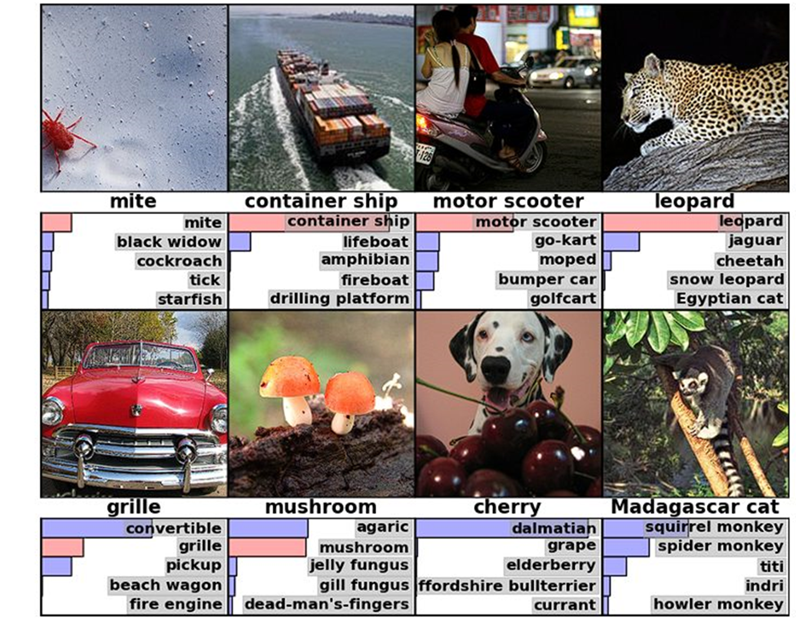
<center>
    <figcaption><b>Figure 3: Sample ImageNet data with class description.</b></figcaption>
</center>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">In the ImageNet challenge, they adjusted ImageNet's variable-resolution images to a consistent size by down-sampling them to 256x256 pixels. They resized the images so the shorter side was 256 pixels, then cropped the central 256x256 patch. The only preprocessing done was subtracting the average activity over the training set from each pixel. Thus, the network was trained on the centered raw RGB values of the pixels.</p>


<a id="Model_Architecture" style="color: black; text-decoration: none;"><h1>Part 1: Model Architecture</h1></a>
<style>
    img {
        max-width: 40%; /* Ensures responsiveness */
        height: auto;   /* Maintains aspect ratio */
    }
</style>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">AlexNet, a deep convolutional neural network to classify 1.2 million high-resolution images into 1000 different categories for the ImageNet LSVRC-2010 contest. This network comprises eight learned layers, including five convolutional and three fully-connected layers with 1000-way softmax, achieved top-1 and top-5 error rates of 37.5% and 17.0%, respectively in the contest. These rates significantly surpassed previous benchmarks. It has a network, with 60 million parameters and 650,000 neurons, used advanced techniques like non-saturating neurons, efficient GPU-based convolution operations, and a dropout regularization method to reduce overfitting. This model variant won the ILSVRC-2012 competition with a top-5 error rate of 15.3%.</p>

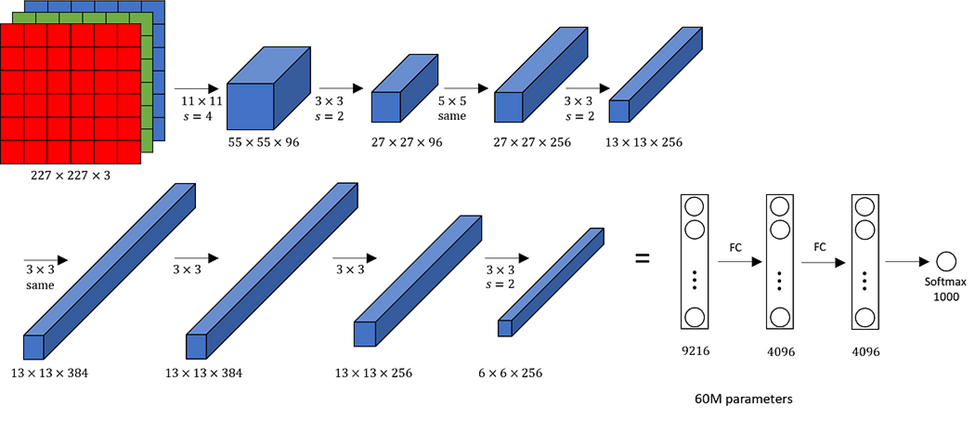
<center>
    <figcaption><b>Figure 4: AlexNet Architecture.</b></figcaption>
</center>
<h3>AlexNet Architecture</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">AlexNet features a relatively straightforward structure when compared to more recent Deep Learning models. It includes eight layers in total: five convolutional layers and three fully connected layers. The model incorporates several pioneering features from its era such as ReLU activation functions, Local Response Normalization (LRN), and Overlapping Max Pooling.</p>

<h3>Input Layer:</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">AlexNet processes images with an input size of <strong>224x224x3 RGB pixels</strong>.</p>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">
<h3>Convolutional Layers:</h3>
<ul  style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;">
    <li><strong>First Layer:</strong> Uses 96 kernels sized 11x11 with a stride of 4, applies ReLU activation, and follows up with Max Pooling.</li>
    <li><strong>Second Layer:</strong> Receives the output from the first layer, utilizing 256 kernels sized 5x5x48.</li>
    <li><strong>Third Layer:</strong> Features 384 kernels sized 3x3x256, with no pooling or normalization.</li>
    <li><strong>Fourth Layer:</strong> Contains 384 kernels sized 3x3x192.</li>
    <li><strong>Fifth Layer:</strong> Includes 256 kernels sized 3x3x192.</li>
</ul>
</p>

<a id="Architectural_Breakdown" style="color: black; text-decoration: none;"><h2>Key Component of Architecture</h2></a>


<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;">
    <li>The <strong>ReLU activation function</strong> is used instead of the traditional 'tanh'.</li>
    <li>It utilizes a <strong>batch size of 128</strong>.</li>
    <li>The learning algorithm is <strong>SGD with momentum</strong>.</li>
    <li>Data augmentation techniques such as <strong>flipping, jittering, cropping, and color normalization</strong> are implemented.</li>
    <li>AlexNet was trained on a <strong>GTX 580 GPU</strong> with 3 GB of memory, necessitating the splitting of the network across <strong>two GPUs</strong> to accommodate all the neurons (feature maps), with each GPU handling half.</li>
</ul>

<a id="Data_Augmentation" style="color: black; text-decoration: none;"><h2>Data Augmentation</h2></a>
    <p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">To prevent overfitting, it's useful to expose the neural network to different versions of the same image. This not only helps generate more data but also encourages the network to learn and remember key features.</p>

<h3>Augmentation by Mirroring</h3>
    <p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">For example, if our training set includes an image of a cat, the network can also learn from the mirror image of that cat. By flipping the image horizontally, we effectively double the size of our training dataset.</p>

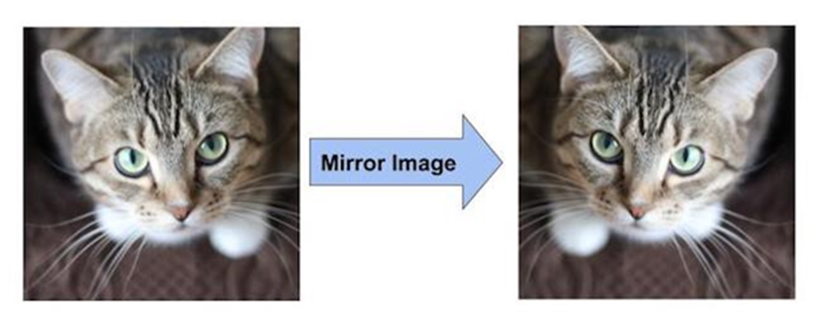
<center>
    <figcaption><b>Figure 5: Augmentation by Mirroring.</b></figcaption>
</center>

<h3>Augmentation by Random Cropping of Images</h3>
    <p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Taking random crops from the original image can also create additional data variations. These variations are essentially the original data but shifted in position.</p>

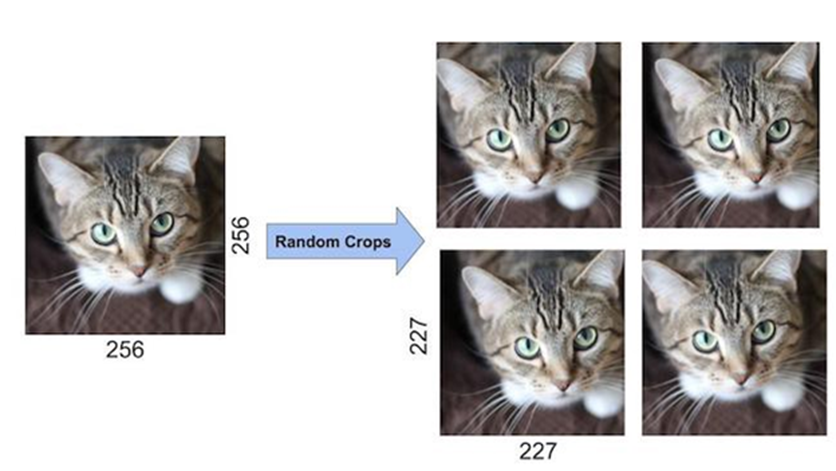
<center>
    <figcaption><b>Figure 6: Augmentation by Random Cropping of Images</b></figcaption>
</center>

   <p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">In AlexNet, random 224x224 crops from the 256x256 original images as inputs for the network. This method increased the dataset size by 2048 times.</p>


In [2]:
import tensorflow as tf

def calculate_mean_std(dataset):
    pixel_sum, pixel_square_sum, num_pixels = 0.0, 0.0, 0
    for image, _ in dataset:
        pixel_sum += tf.reduce_sum(image)
        pixel_square_sum += tf.reduce_sum(tf.square(image))
        num_pixels += tf.size(image)

    mean = pixel_sum / tf.cast(num_pixels, tf.float32)
    std_dev = tf.sqrt(
        pixel_square_sum / tf.cast(num_pixels, tf.float32) - tf.square(mean)
    )
    return mean, std_dev

def normalize_image(image, mean, std_dev):
    # Subtract mean and divide by standard deviation
    return (image - mean) / std_dev

# Function to normalize image and label pairs
def normalize_image_dataset(image, label):
    image = normalize_image(image, mean, std_dev)
    return image, label

# Function to apply horizontal reflection
def horizontal_reflection(image, label):
    image = tf.image.flip_left_right(image)
    return image, label

# Function to adjust brightness
def adjusting_brightness(image, label):
    image = tf.image.adjust_brightness(image, 0.2)
    return image, label

def DataAugmentation(dataset):
    # Applying Mean Normalization
    dataset = dataset.map(normalize_image_dataset, num_parallel_calls=tf.data.AUTOTUNE)

    # Applying Horizontal flip
    dataset = dataset.map(horizontal_reflection, num_parallel_calls=tf.data.AUTOTUNE)

    # Applying brightness adjustment
    dataset = dataset.map(adjusting_brightness, num_parallel_calls=tf.data.AUTOTUNE)

    return dataset




<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Here we calculate the mean and standard deviation of dataset, normalizes images based on these statistics, and applies data augmentation techniques like horizontal flipping and optional brightness adjustment. The transformations are applied to both training and validation datasets, enhancing generalization and efficiency during model training.</p>


<a id="ReLU" style="color: black; text-decoration: none;"><h2>ReLU</h2></a>
    <p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Another key aspect of AlexNet is its use of the <strong>ReLU (Rectified Linear Unit) nonlinearity</strong>, which marked a departure from the traditional tanh or sigmoid activation functions. It was not the first time in exploring alternatives to conventional neuron models in CNNs. For instance, Jarrett et al. [3] have demonstrated that the nonlinearity \( f(x) = | tanh(x) | \) is particularly effective when combined with their method of contrast normalization and local average pooling on the Caltech-101 dataset. ReLUs allow deep CNNs to train much faster than networks using saturating activations like tanh or sigmoid. This is demonstrated in a comparison where using ReLUs enabled AlexNet to achieve a 25% training error rate six times faster than using tanh, as tested on the CIFAR-10 dataset.</p>

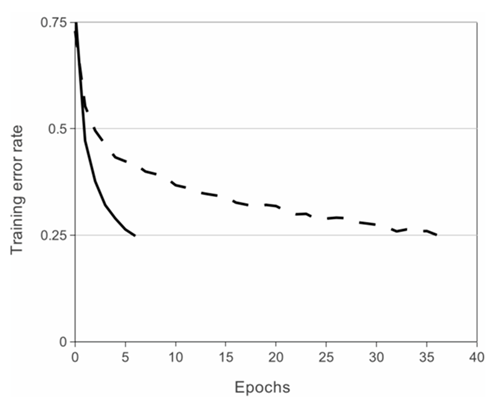
<center>
    <figcaption><b>Figure 7: Training error rates of CNN using Relu (solid line) , tanh (dashed line) as activation functions</b></figcaption>
</center>
    <p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">The ReLU function is defined as <code>f(x) = max(0, x)</code>. This function does not saturate in the same way tanh does because its derivative remains constant (and non-zero) for positive inputs, which facilitates faster convergence during optimization. For negative values, although the derivative is zero, it generally does not affect training speed adversely because most neurons tend to take on positive values. This characteristic makes ReLUs superior to sigmoid functions as well, which also suffer from saturation issues.</p>


 

In [3]:
import tensorflow as tf

# ReLU activation function
relu = tf.keras.activations.relu

# Example tensor from a numpy array
x = tf.constant([1.0, -1.0, -0.5, 0.32])

# Applying ReLU
relu_x = relu(x)

#Output = [1.0, 0.0, 0.0, 0.32]



   
 <h3>Comparison of Activation Functions</h3>
    <p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">The graphs of the tanh and ReLU activation functions illustrate the differences in their behavior. The tanh function saturates for very high or very low values of <em>z</em>, where its slope approaches zero. This property can hinder the speed of gradient descent because changes in the input produce minimal changes in the output. Conversely, the ReLU function maintains a constant, non-zero slope for positive values of <em>z</em>, which aids in faster convergence during optimization. For negative values, although the slope is zero, it doesn't generally slow down learning, as most neurons in a neural network activate positively. For these reasons, ReLU is often preferred over the sigmoid function, which similarly suffers from saturation.</p>

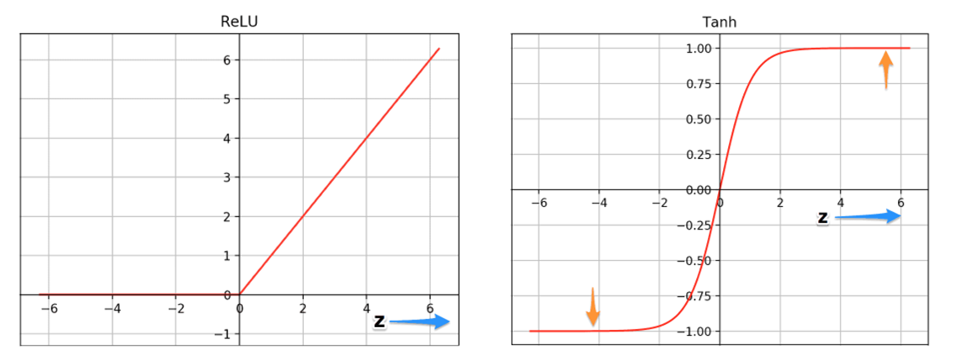
<center>
    <figcaption><b>Figure 8: Graphs of Relu , tanh  activation functions</b></figcaption>
</center>

<a id="Conv2D" style="color: black; text-decoration: none;"><h2>Convolutional  Layer</h2></a>
<style>
    img {
        max-width: 40%; /* Ensures responsiveness */
        height: auto;   /* Maintains aspect ratio */
    }
</style>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Convolutional layers are the foundation of convolutional neural networks (CNNs), which excel at tasks like image and video recognition, as well as other data involving spatial patterns. Here’s an in-depth look at its key components:</p>

<h3>Convolution Operation</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">The convolution operation involves sliding a filter (or kernel) over the input data, performing element-wise multiplication and summation. This process helps extract important features, such as edges, textures, and patterns.</p>

<h3>Filters (Kernels)</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Filters are small matrices (typically 3x3, 5x5, etc.) applied to the input data to detect specific features, such as edges, corners, or textures. Each filter learns to recognize different patterns, with its values being updated during the training process.</p>

<h3>Stride</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Stride refers to how the filter moves across the input data in terms of rows and columns. For example, with a stride of 1, the filter moves one pixel at a time both horizontally (across columns) and vertically (across rows). With a stride of 2, the filter moves two pixels at a time in both directions, which reduces the size of the output feature map.</p>


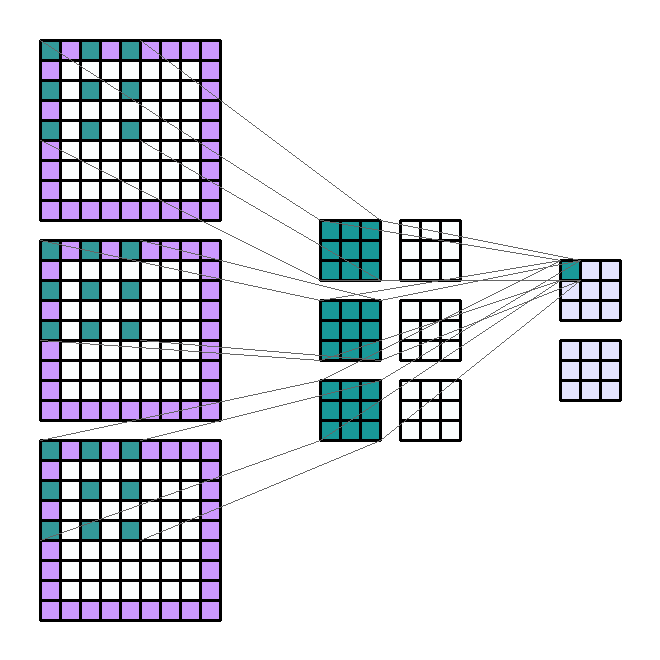
<center>
    <figcaption><b>Figure 9: Process of convolution in  neural network,</b></figcaption>
</center>

<h3>Padding</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Padding involves adding extra pixels, typically zeros, around the input data. This helps control the spatial dimensions of the output feature map and can preserve the size of the input after convolution. Padding is especially useful in deeper networks, where maintaining the input size is crucial for effective processing.</p>

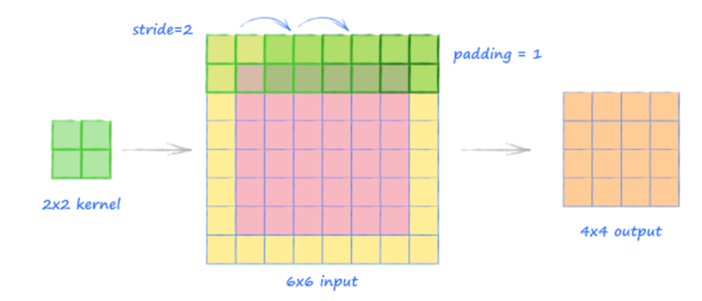
<center>
    <figcaption><b>Figure 10: Process of padding in CNNs,</b></figcaption>
</center>


<h3>How Convolution Works in General</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">In convolutional layers, each filter (or kernel) slides across the input image, computing dot products between the filter values and the image pixel values in the area the filter covers. This produces an output feature map where each "pixel" represents a feature detected in that region.
</p>

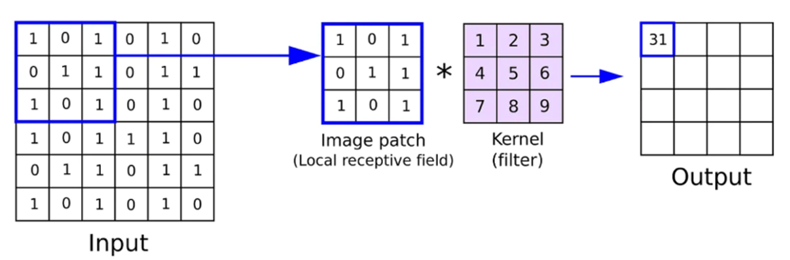
<center>
    <figcaption><b>Figure 11: Working of Convolutions,</b></figcaption>
</center>




<h1>Convolution in Code</h1>

<h2>Explanation of the Code</h2>

<h3>Class Initialization:</h3>

<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;">
  <li>The <code>__init__</code> method initializes the convolutional layer with the specified parameters: number of filters, kernel size, stride, and padding type.</li>
</ul>

<h3>Kernel Initialization:</h3>

<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;">
  <li>The <code>initialize_kernels</code> method initializes the convolutional kernels with random values. These kernels are used to scan the input image and extract features. The number of input channels is required to determine the shape of the kernels.</li>
</ul>

<h3>Padding Application:</h3>

<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;">
  <li>The <code>apply_padding</code> method applies zero padding around the image if <code>padding='same'</code> is specified.</li>
</ul>

<h3>Forward Pass (Convolution):</h3>

<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
        <li>In the <code>forward</code> method, the input image is padded if necessary, and then we calculate the output dimensions based on the stride and kernel size.</li>
        <li>We iterate over each filter and slide the kernel across the image for each spatial position, calculating the sum of element-wise products for each region covered by the kernel and storing the result in the output.</li>
</ul>




<h3>Example Usage:</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">We create a simulated RGB image of shape 227 x 227 x 3 to match the input size of AlexNet. We then initialize a Conv2D layer to represent the first layer of AlexNet, with 96 filters, an 11 x 11 kernel, a stride of 4, and padding to preserve the spatial dimensions. When we apply this layer to the image, the output shape is 55 x 55 x 96, which represents the downsampled feature maps for each of the 96 filters in this layer.</p>

<h3>Key Differences from TensorFlow's Conv2D:</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">This code is a simplified version, focusing specifically on mimicking Conv2D functionality with its distinct input size, kernel, stride, and number of filters.</p>


<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
        <li>It doesn’t include options for initializing kernels with other distributions or scaling.</li>
        <li>It lacks bias terms and activation functions, which are typically applied in Conv2D layers.</li>
        <li>The code doesn’t support advanced features like weight decay or backpropagation for training.</li>
        <li>This implementation provides a clear view of the convolution mechanics and can be expanded to include more complex features if needed.</li>
</ul>




In [4]:
import numpy as np

class Conv2D:
    def __init__(self, filters, kernel_size, stride=1, padding='valid'):
        '''
        Initializes the Conv2D layer.
        
        Parameters:
        - filters (int): Number of filters to apply.
        - kernel_size (tuple): Size of the kernel (height, width).
        - stride (int): Step size for moving the kernel over the input.
        - padding (str): 'valid' (no padding) or 'same' (padding to keep spatial dimensions).
        '''
        self.filters = filters
        self.kernel_size = kernel_size
        self.stride = stride
        self.padding = padding
        self.kernels = None  # To hold the kernels once initialized

    def initialize_kernels(self, input_channels):
        '''
        Initializes the kernels (filters) for each input channel.
        
        Parameters:
        - input_channels (int): Number of channels in the input image.
        
        This method randomly initializes the kernels with a normal distribution.
        Each kernel has a shape of (filters, kernel_height, kernel_width, input_channels).
        '''
        kernel_height, kernel_width = self.kernel_size
        # Randomly initialize kernels for each filter and input channel
        self.kernels = np.random.randn(self.filters, kernel_height, kernel_width, input_channels)

    def apply_padding(self, image, pad_h, pad_w):
        '''
        Pads the input image with zeros if necessary.
        
        Parameters:
        - image (np.array): The input image.
        - pad_h (int): Height of padding.
        - pad_w (int): Width of padding.
        
        Returns:
        - np.array: The padded image.
        '''
        return np.pad(image, ((pad_h, pad_h), (pad_w, pad_w), (0, 0)), mode='constant', constant_values=0)

    def forward(self, image):
        '''
        Performs the convolution operation on the input image.
        
        Parameters:
        - image (np.array): Input image with shape (height, width, channels).
        
        Returns:
        - np.array: Output of the convolution operation with shape (output_height, output_width, filters).
        '''
        # Initialize the kernels if not done already
        if self.kernels is None:
            self.initialize_kernels(input_channels=image.shape[2])

        # Image dimensions and kernel dimensions
        image_height, image_width, image_channels = image.shape
        kernel_height, kernel_width, _ = self.kernels.shape[1:]
        
        # Calculate padding if needed
        if self.padding == 'same':
            pad_h = (kernel_height - 1) // 2
            pad_w = (kernel_width - 1) // 2
            image = self.apply_padding(image, pad_h, pad_w)
        elif self.padding == 'valid':
            pad_h, pad_w = 0, 0

        # Calculate output dimensions
        output_height = (image.shape[0] - kernel_height) // self.stride + 1
        output_width = (image.shape[1] - kernel_width) // self.stride + 1
        
        # Initialize the output array to store feature maps for each filter
        result = np.zeros((output_height, output_width, self.filters))
        
        # Perform convolution
        for f in range(self.filters):
            # Select the kernel for the current filter
            kernel = self.kernels[f]
            for y in range(output_height):
                for x in range(output_width):
                    # Extract the region of interest for the current location and all channels
                    region = image[
                        y * self.stride : y * self.stride + kernel_height,
                        x * self.stride : x * self.stride + kernel_width,
                        :
                    ]
                    # Apply the filter to the region and sum across channels
                    result[y, x, f] = np.sum(region * kernel)
        
        return result

# Example usage
# Simulated RGB image with dimensions (227, 227, 3)
image = np.random.randn(227, 227,3)

# Instantiate the Conv2D layer with 96 filters, an 11x11 kernel size, stride of 4, and 'same' padding
conv_layer = Conv2D(filters=96, kernel_size=(11, 11), stride=4, padding='valid')

# Apply the convolution layer to the image
output = conv_layer.forward(image)

print("Image shape:\n", image.shape)
print("Output Shape of convolution:\n", output.shape)


Image shape:
 (227, 227, 3)
Output Shape of convolution:
 (55, 55, 96)



<style>
    img {
        max-width: 40%; /* Ensures responsiveness */
        height: auto;   /* Maintains aspect ratio */
    }
</style>

<a id="MaxPooling" style="color: black; text-decoration: none;"><h2>MaxPooling</h2></a>
    <p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">
        Max pooling is a technique often incorporated into <strong>Convolutional Neural Network (CNN)</strong> architectures. 
        Its primary function is to reduce the spatial dimensions of the feature maps created by filtering an image. 
        This reduction in size decreases both the number of parameters and the computational complexity of the network, 
        helping to streamline processing.
    </p>
    <h3>Benefits of Max Pooling</h3>
    <p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">
        Max pooling serves multiple purposes, it helps prevent overfitting by abstracting the features of the input, 
        reduces the number of parameters that the network needs to learn, and imparts a basic level of translation 
        invariance to the model's internal representation. It achieves this by applying a maximum filter to typically 
        non-overlapping sections of the feature map.
    </p>
    
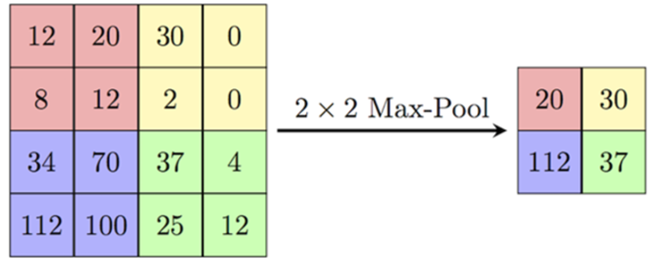

<center>
    <figcaption><b>Figure 12: Working of Max-Pooling</b></figcaption>
</center>

<style>
    .circle-bullets ul {
        list-style-type: none; /* Removes default bullets */
        padding: 0;
    }
    .circle-bullets li {
        margin-left: 20px; /* Adjusts spacing for the bullet */
        position: relative;
    }
    .circle-bullets li:before {
        content: '●'; /* Circle bullet symbol */
        position: absolute;
        left: -20px; /* Positioning the bullet to the left of the text */
        color: white; /* Ensures the bullet is black */
    }
</style>


<h3>In AlexNet</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">
    In AlexNet, it was chosen to use max pooling windows of size <strong>3x3</strong> with a stride of <strong>2</strong>, 
    allowing some overlap between windows. This configuration of max pooling contributed to a decrease in the 
    top-1 error rate by <strong>0.4%</strong> and the top-5 error rate by <strong>0.3%</strong>. In contrast, 
    using non-overlapping pooling windows of size <strong>2x2</strong> with a stride of <strong>2</strong> would 
    result in the same output dimensions but without these improvements in error rates.
</p>
<h3>Overlapping Max Pooling</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"> 
    Overlapping Max Pooling: Max pooling layers are commonly used in Convolutional Neural Networks (CNNs) to down-sample the spatial dimensions (width and height) of input tensors while maintaining the same depth. Overlapping max pooling differs from standard max pooling in that the regions over which the maximum is calculated overlap. In AlexNet, this method involves using 3x3 windows with a stride of 2, allowing adjacent pooling areas to overlap. This overlapping pooling strategy helps enhance feature extraction and has been shown to reduce the top-1 and top-5 error rates by 0.4% and 0.3% respectively, compared to non-overlapping pooling with 2x2 windows and a stride of 2. Additionally, overlapping pooling contributes to better generalization and slight reduction in overfitting during the training process.
</p>

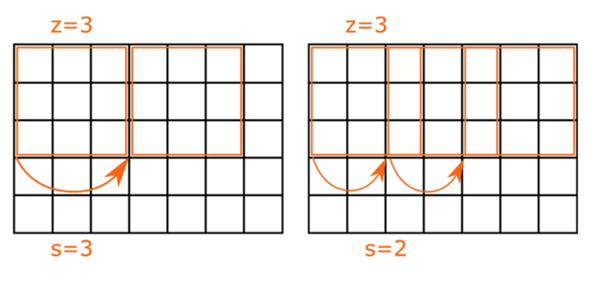
<center>
    <figcaption><b>Figure 13: Working of Overlapping Max pooling </b></figcaption>
</center>
<h2>Max Pooling in Code</h2>

<h3>Explanation of the Code</h3>
<h3>1. Class Initialization:</h3>
<div class="circle-bullets" style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;">
    <ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
        <li><strong>pool_size:</strong> The height and width of the pooling window (typically 2x2 or 3x3).</li>
        <li><strong>stride:</strong> The step size to move the window. If not provided, it defaults to the same as the <code>pool_size</code>.</li>
        <li><strong>padding:</strong> Whether to apply padding ('same') for zero-padding or 'valid' for no padding.</li>
    </ul>
</div>



<h3>2. Padding:</h3>
<div class="circle-bullets" style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;">
<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li>
        If padding is needed (<code>'same'</code>), we compute the required amount of padding for both height and width based on the pooling window size and apply zero-padding to the image.
    </li>
</ul>
</div>

<h2>3. Forward Pass (Pooling Operation):</h2>
<div class="circle-bullets" style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;">
<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li>
        We iterate over each position in the output tensor and extract a region of the input tensor based on the pooling window size and stride.
        </li>
        <li>
            The maximum value within each region is recorded in the output tensor.
        </li>
    </ul>
 </div>

<h3>4. Example Usage:</h3>
<div class="circle-bullets" style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;">
<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li>
        We simulate a 55×55 image with 96 channels, replicating the 1st pooling layer of AlexNet, and apply a <code>MaxPooling2D</code> layer with a 3x3 pooling window and stride of 2.
    </li>
    <li>
        This results in down-sampling the image to a smaller size.
    </li>
</ul>
</div>

<h3>Key Differences from TensorFlow's MaxPooling2D</h3>
<div class="circle-bullets" style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;">
<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li>
        <strong>Training & Inference Modes:</strong> This implementation does not have separate behavior for training and inference like some other layers (though max pooling typically doesn't change in inference).
    </li>
    <li>
        <strong>Batch Processing:</strong> The code currently processes one image at a time. To handle a batch of images, you'd extend this to loop over the batch dimension.
    </li>
    <li>
        <strong>Efficient Computation:</strong> This implementation is written for clarity and learning purposes, and it may not be as optimized as TensorFlow's <code>MaxPooling2D</code>, which is highly optimized and runs on GPU.
</li>
</ul>
</div>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"> This custom implementation can be used for learning purposes or as part of a larger neural network framework.</p>



In [5]:
import numpy as np

class MaxPooling2D:
    def __init__(self, pool_size=(2, 2), stride=None, padding='valid'):
        """
        Initializes the MaxPooling2D layer.
        
        Parameters:
        - pool_size (tuple): Size of the pooling window (height, width).
        - stride (int or tuple): Step size for moving the pooling window.
        - padding (str): 'valid' (no padding) or 'same' (zero padding).
        """
        self.pool_size = pool_size
        self.stride = stride if stride is not None else pool_size  # Default to pool_size if stride is None
        self.padding = padding

    def apply_padding(self, image, pad_h, pad_w):
        """
        Pads the input image with zeros if necessary.
        
        Parameters:
        - image (np.array): The input image.
        - pad_h (int): Padding height.
        - pad_w (int): Padding width.
        
        Returns:
        - np.array: Padded image.
        """
        return np.pad(image, ((pad_h, pad_h), (pad_w, pad_w), (0, 0)), mode='constant', constant_values=0)

    def forward(self, image):
        """
        Performs the max pooling operation.
        
        Parameters:
        - image (np.array): Input image with shape (height, width, channels).
        
        Returns:
        - np.array: The pooled image.
        """
        # Image dimensions
        image_height, image_width, channels = image.shape
        pool_height, pool_width = self.pool_size

        # Padding if necessary
        if self.padding == 'same':
            pad_h = (pool_height - 1) // 2
            pad_w = (pool_width - 1) // 2
            image = self.apply_padding(image, pad_h, pad_w)
        elif self.padding == 'valid':
            pad_h, pad_w = 0, 0

        # Calculate output dimensions
        output_height = (image.shape[0] - pool_height) // self.stride[0] + 1
        output_width = (image.shape[1] - pool_width) // self.stride[1] + 1
        
        # Initialize the output array
        pooled_output = np.zeros((output_height, output_width, channels))

        # Perform pooling operation
        for h in range(output_height):
            for w in range(output_width):
                for c in range(channels):
                    # Extract the region of interest (ROI) for the current filter position
                    region = image[
                        h * self.stride[0]: h * self.stride[0] + pool_height,
                        w * self.stride[1]: w * self.stride[1] + pool_width,
                        c
                    ]
                    # Apply max pooling to the region
                    pooled_output[h, w, c] = np.max(region)

        return pooled_output

# Example usage
# Simulated image with batch size of 1, height=6, width=6, and 1 channel
image = np.random.randn(55, 55, 96)

# Instantiate the MaxPooling2D layer with pool_size=(2, 2), stride=(2, 2), and 'valid' padding
#max_pool = MaxPooling2D(pool_size=(2, 2), stride=(2, 2), padding='valid')
max_pool= MaxPooling2D(pool_size=(3,3), stride=(2,2), padding='valid')


# Apply the max pooling operation to the image
output = max_pool.forward(image)
print("Input Shape:\n",image.shape)
print("Output Shape of MaxPooling2D:\n", output.shape)


Input Shape:
 (55, 55, 96)
Output Shape of MaxPooling2D:
 (27, 27, 96)


<style>
    img {
        max-width: 20%; /* Ensures responsiveness */
        height: 80%;   /* Maintains aspect ratio */
    }
</style>
<a id="Feed_Forward_Network" style="color: black; text-decoration: none;"><h2>Fully Connected Layers ( FFN )</h2></a>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Fully connected (FC) layers are crucial components of Convolutional Neural Networks (CNNs), connecting every neuron in one layer to the next. Unlike convolutional and pooling layers, which collect spatial features, fully connected layers combine all previously learned features to create final predictions.</p>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"> AlexNet's final layers are completely connected and incorporate high-level information obtained in previous convolutional layers. These layers enable complicated decision-making by combining all feature maps and assigning them to specified classes.</p>

<h2>SoftMax Layer</h2>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"> The softmax layer, often the final layer in CNNs for classification tasks, converts output values from the previous layer into probabilities for each class. It’s defined by the formula:</p>

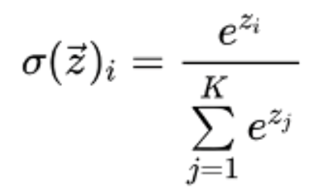
 
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"> where zi represents the input score for each class.</p>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"> In AlexNet, the softmax layer assigns probabilities to each class, allowing the network to make a clear prediction by identifying the class with the highest probability. This final step turns high-level features into an interpretable output, guiding the model to its classification decision.</p>


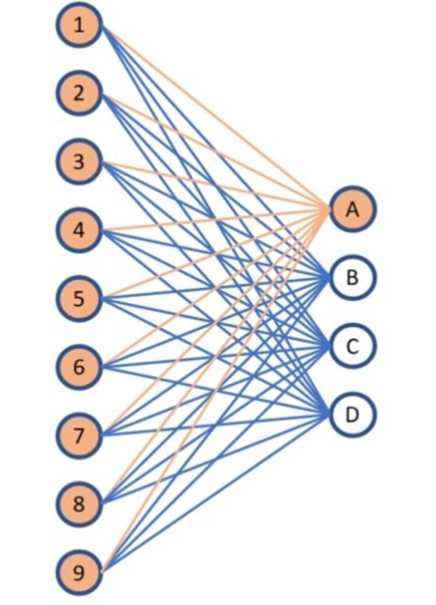
<center>
    <figcaption><b>Figure 14: Fully Connected Layer</b></figcaption>
</center>


<h2>Fully Connected in Code</h2>
<h3>Explanation of the Code</h3>

<h4>Class Initialization:</h4>
<ul class="circle-bullets" style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;">
    <li>The <code>__init__</code> method sets up the Dense layer with the given number of input and output features, preparing the layer for use.</li>
</ul>

<h4>Parameter Initialization:</h4>
<ul class="circle-bullets" style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;">
    <li>The <code>initialize_params</code> method initializes weights with random values scaled for balanced activations and sets biases to zero.</li>
</ul>

<h4>Forward Pass (Computation):</h4>

<ul class="circle-bullets" style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;">
    <li>The <code>forward</code> method computes the output by performing a dot product of the input with the weights and adding the biases.</li>
</ul>


<h3>Key Points:</h3>

<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li>Weights are initialized to ensure variance is maintained.</li>
    <li>Biases are initialized to zero.</li>
    <li>The forward pass transforms inputs to outputs through matrix multiplication and bias addition.</li>
</ul>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">This concise implementation illustrates the fundamental workings of a Dense layer, ideal for learning and understanding the basics. </p>


In [6]:
class Dense:
    def __init__(self, in_features, out_features):
        """
        Initializes the Dense (fully connected) layer.
        
        Parameters:
        - input_size (int): Number of input features.
        - output_size (int): Number of output features.
        """
        self.input_size = in_features
        self.output_size = out_features
        self.weights = None
        self.biases = None
        self.initialize_params()

    def initialize_params(self):
        """
        Initializes weights and biases with random values.
        
        Weights are initialized using a normal distribution.
        Biases are initialized to zeros.
        """
        self.weights = np.random.randn(self.input_size, self.output_size) * np.sqrt(2. / self.input_size)
        self.biases = np.zeros((1, self.output_size))

    def forward(self, input_data):
        """
        Performs the forward pass of the Dense layer.
        
        Parameters:
        - input_data (np.array): Input data with shape (batch_size, input_size).
        
        Returns:
        - np.array: Output of the dense layer with shape (batch_size, output_size).
        """
        return np.dot(input_data, self.weights) + self.biases



<a id="Local_Response_Normalization" style="color: black; text-decoration: none;"><h2>Local Response Normalization</h2></a>
<style>
    img {
        max-width: 40%; /* Ensures responsiveness */
        height: auto;   /* Maintains aspect ratio */
    }
</style>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"><strong>Local Response Normalization (LRN):</strong> Local Response Normalization (LRN) is a technique used to normalize the activations of neurons in a neural network by considering the activities of neighboring neurons within the same layer. Typically applied after the ReLU activation, LRN encourages competition among neurons, preventing any single neuron from dominating and promoting more balanced feature learning. This regularization helps improve generalization, making the network less likely to overfit and better able to handle unseen data. In practice, LRN has been shown to boost performance, as seen in AlexNet, where it contributed to improved accuracy and reduced error rates. LRN is computationally intensive, so it is only applied to the first two convolutional layers in AlexNet to avoid a significant performance cost in deeper layers.</p>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">The formula for LRN is shown below:</p>



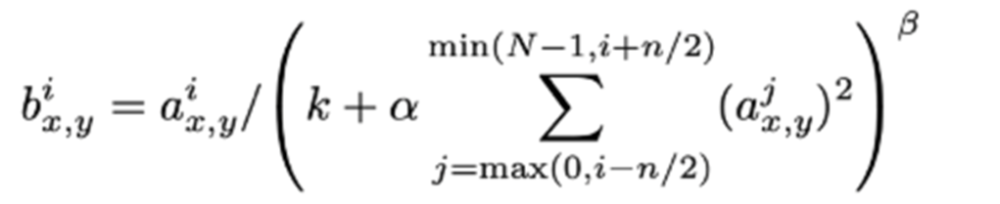

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">where:</p>
<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0">
  <li><strong>b<sup>i</sup><sub>x,y</sub></strong>: The normalized activity of the neuron at position (x, y) in the ith channel.</li>
  <li><strong>a<sup>i</sup><sub>x,y</sub></strong>: The original activity of the neuron before normalization.</li>
  <li><strong>j</strong>: Index of the neighboring neurons.</li>
  <li><strong>k, α, β and n</strong> are Hyperparameters of the normalization. For AlexNet these are set as: k = 2, α=10<sup>-4</sup>, β=0.75, n=5</li>
</ul>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">To better understand Local Response Normalization (LRN), let’s consider an example: Suppose we have 3 feature maps (or channels) from a convolutional layer, each containing 4x4 activations at a certain spatial position in an image. We’ll focus on the same position across all feature maps, as LRN normalizes a neuron's value by considering the activations of its neighbors in other feature maps at the same spatial location.</p>

<style>
    .circle-bullets ul {
        list-style-type: none; /* Removes default bullets */
        padding: 0;
    }
    .circle-bullets li {
        margin-left: 20px; /* Adjusts spacing for the bullet */
        position: relative;
    }
    .circle-bullets li:before {
        content: '●'; /* Circle bullet symbol */
        position: absolute;
        left: -20px; /* Positioning the bullet to the left of the text */
        color: white; /* Ensures the bullet is black */
    }
</style>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"><strong>Improvements:</strong> In AlexNet, applying LRN resulted in:</p>
<div class="circle-bullets" style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;">

<ul >
  <li>1.4% improvement in top 1 error rate.</li>
  <li>1.2% improvement in top 5 error rate.</li>
</ul>
</div>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">These improvements indicate better generalization and accuracy on the validation set due to the normalization effect.</p>



In [7]:
import numpy as np

class custom_LocalResponseNormalization:
    def __init__(self, depth_radius=5, bias=1.0, alpha=1e-4, beta=0.75):
        """
        Initializes the LocalResponseNormalization layer.

        Parameters:
        - depth_radius (int): Number of neighboring channels for normalization.
        - bias (float): Added to the normalization term to avoid division by zero.
        - alpha (float): Scaling parameter.
        - beta (float): Exponent for normalization.
        """
        self.depth_radius = depth_radius
        self.bias = bias
        self.alpha = alpha
        self.beta = beta

    def forward(self, X):
        """
        Applies local response normalization to the input data.

        Parameters:
        - X (np.array): Input data with shape (height, width, channels).

        Returns:
        - np.array: The normalized data.
        """
        H, W, C = X.shape  # height, width, channels
        squared_input = np.square(X)
        output = np.zeros_like(X)

        for h in range(H):  # Iterate over height
            for w in range(W):  # Iterate over width
                for c in range(C):  # Iterate over channels
                    # Define the start and end of the depth radius range
                    start = max(0, c - self.depth_radius // 2)
                    end = min(C, c + self.depth_radius // 2 + 1)

                    # Sum the square of inputs within the local region
                    local_sum = np.sum(squared_input[h, w, start:end], axis=0)
                    
                    # Apply LRN formula
                    scale = self.bias + (self.alpha * local_sum)
                    output[h, w, c] = X[h, w, c] / (scale ** self.beta)

        return output




<style>
    img {
        max-width: 40%; /* Ensures responsiveness */
        height: auto;   /* Maintains aspect ratio */
    }
</style>
<a id="DropOut" style="color: black; text-decoration: none;"><h2>DropOut</h2></a>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">With around 60 million parameters to train, the creators of AlexNet looked for extra ways to avoid overfitting. One method they used was the dropout technique, introduced by G.E. Hinton in 2012 [1]. In dropout, there's a 50% chance that each neuron is temporarily left out during training, which means it doesn't affect the learning process. This variation ensures that every input is handled by a slightly different configuration of the network, which makes the network's learning more effective and less likely to overfit. Dropout isn't used during testing; the whole network is active, and the outputs are halved to balance out the effect of the dropout during training. While dropout does make training take twice as long, it significantly helps prevent AlexNet from overfitting.</p>



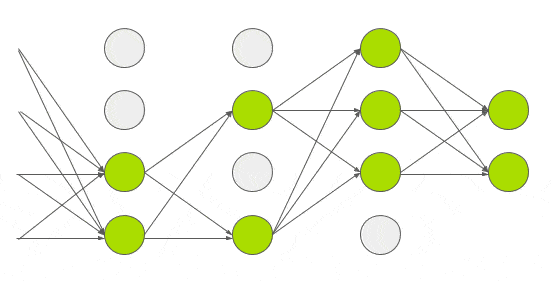
<center>
    <figcaption><b>Figure 15: Droupout Mechanism</b></figcaption>
</center>

<a id="AlexNet_Architecture" style="color: black; text-decoration: none;"><h2>AlexNet Architecture</h2></a>

  
<style>
    img {
        max-width: 40%; /* Ensures responsiveness */
        height: auto;   /* Maintains aspect ratio */
    }
</style>




<h3>Input</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">In AlexNet, minimal pre-processing is applied to the input images: each pixel’s value is adjusted by subtracting the mean pixel activity across the entire training set, centering the pixel values and aiding model training. While the standard input image size for AlexNet is generally 224x224x3 (height, width, and color channels), an input size of 227x227x3 is used in calculations to simplify the output feature map dimensions in the first convolutional layer.</p>

<h3>First Convolutional Layer</h3>
<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li>Filter (Kernel) Size: 11 x 11</li>
    <li>Stride: 4</li>
    <li>Number of Filters: 96</li>
    <li>Padding: No padding</li>
</ul>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">In convolutional layers, each filter (or kernel) slides across the input image, computing dot products between the filter values and the image pixel values in the area the filter covers. This produces an output feature map where each "pixel" represents a feature detected in that region.</p>

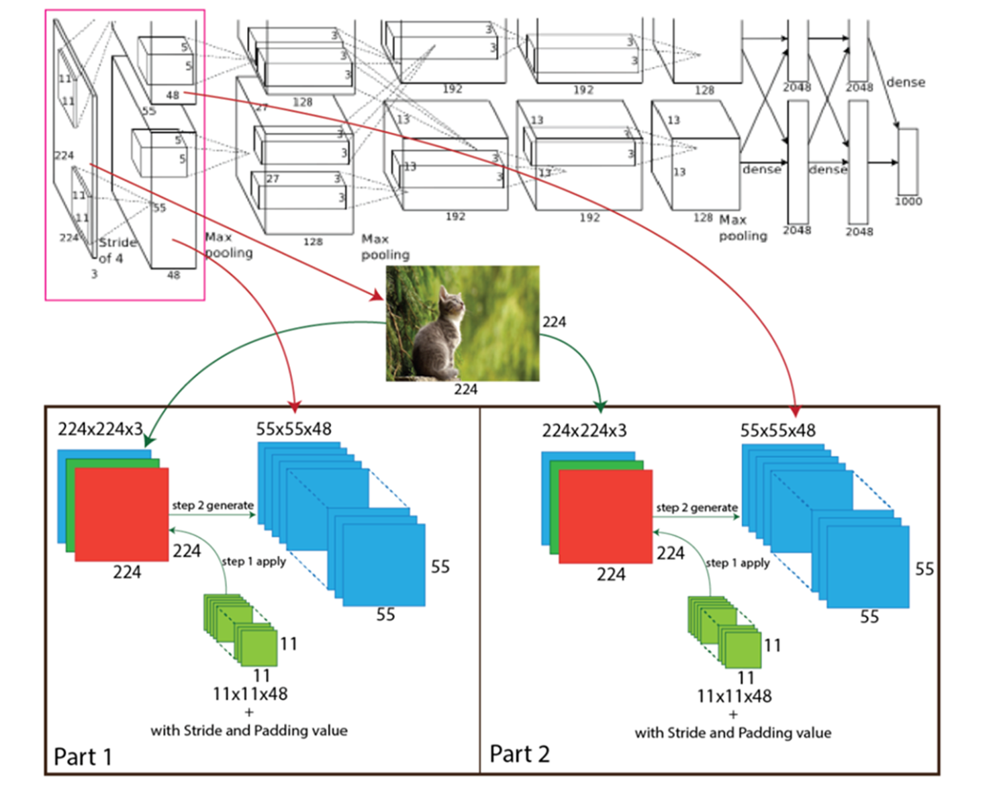
<center>
    <figcaption><b>Figure 16: Internal Respresentation of how convolutional process applied to input image</b></figcaption>
</center>

<h3>Output Dimension Calculation</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">The formula for calculating the output dimension (<code>Wout</code>, <code>Hout</code>) of a convolutional layer:</p>
<pre>
    Wout = ((Win + 2P - K) / S) + 1
    Hout = ((Hin + 2P - K) / S) + 1
</pre>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Plugging in AlexNet’s values:</p>
<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li>Win = 227</li>
    <li>Hin = 227</li>
    <li>K = 11</li>
    <li>S = 4</li>
    <li>P = 0</li>
</ul>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Wout = ((227 + 2*0 - 11) / 4) + 1 = (216 / 4) + 1 = 55<br>
    Hout = ((227 + 2*0 - 11) / 4) + 1 = (216 / 4) + 1 = 55</p>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Output feature map size: 55 x 55 x 96</p>

<h3>ReLU and LRN</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">After each convolution in AlexNet, a ReLU activation function is applied element-wise, setting negative values to zero while keeping positive values unchanged. In this layer, ReLU is followed by Local Response Normalization (LRN), which normalizes activations across neighboring feature maps to improve generalization and reduce overfitting.</p>

<h3>Implementation</h3>


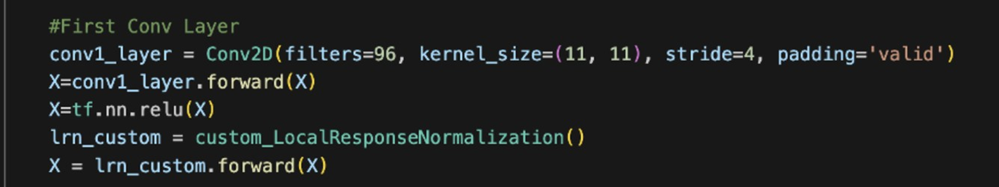



<h2>First Pooling Layer</h2>
<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li>Kernel Size: 3 x 3</li>
    <li>Stride: 2</li>
    <li>Padding: No padding</li>
</ul>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">The input to this layer is the output from the first convolutional layer, which has dimensions 55 x 55 x 96.</p>

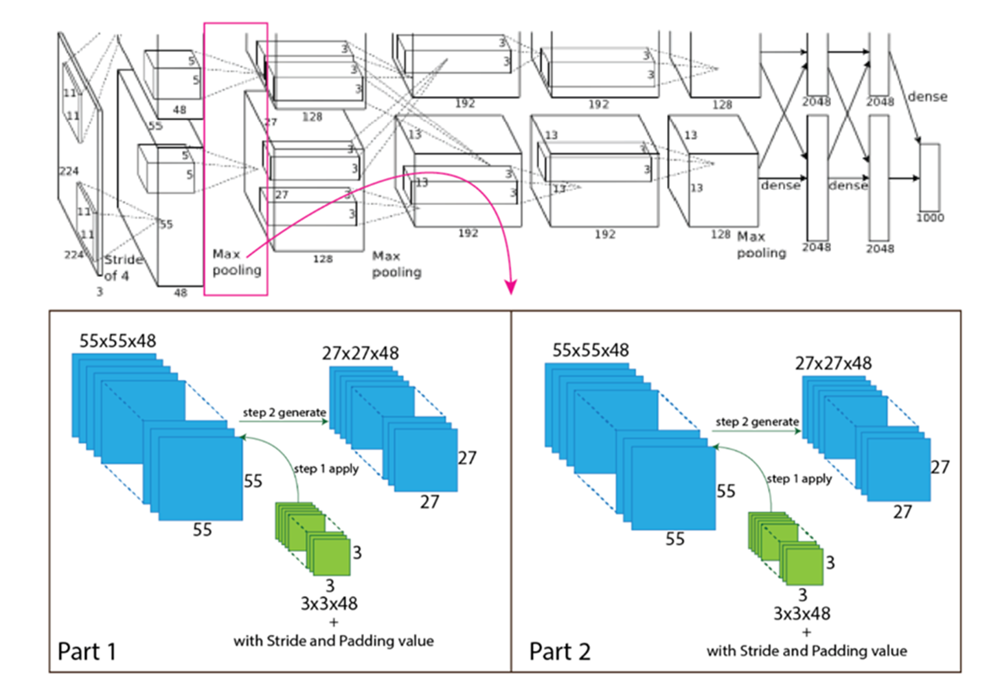
<center>
    <figcaption><b>Figure 18: Internal tranformations during convolutional process and pooling </b></figcaption>
</center>


<h3>Output Dimension Calculation</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Plugging in values:</p>
<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li>Win = 55</li>
    <li>Hin = 55</li>
    <li>K = 3</li>
    <li>S = 2</li>
    <li>P = 0</li>
</ul>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Wout = ((55 + 2*0 - 3) / 2) + 1 = 27<br>
    Hout = ((55 + 2*0 - 3) / 2) + 1 = 27</p>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Output feature map size: 27 x 27 x 96</p>

<h3>Implementation</h3>

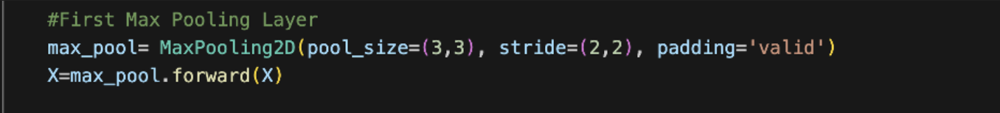


<h2>Second Convolutional Layer</h2>
<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li>Filter (Kernel) Size: 5 x 5</li>
    <li>Stride: 1</li>
    <li>Number of Filters: 256</li>
    <li>Padding: 2 (Same padding)</li>
</ul>

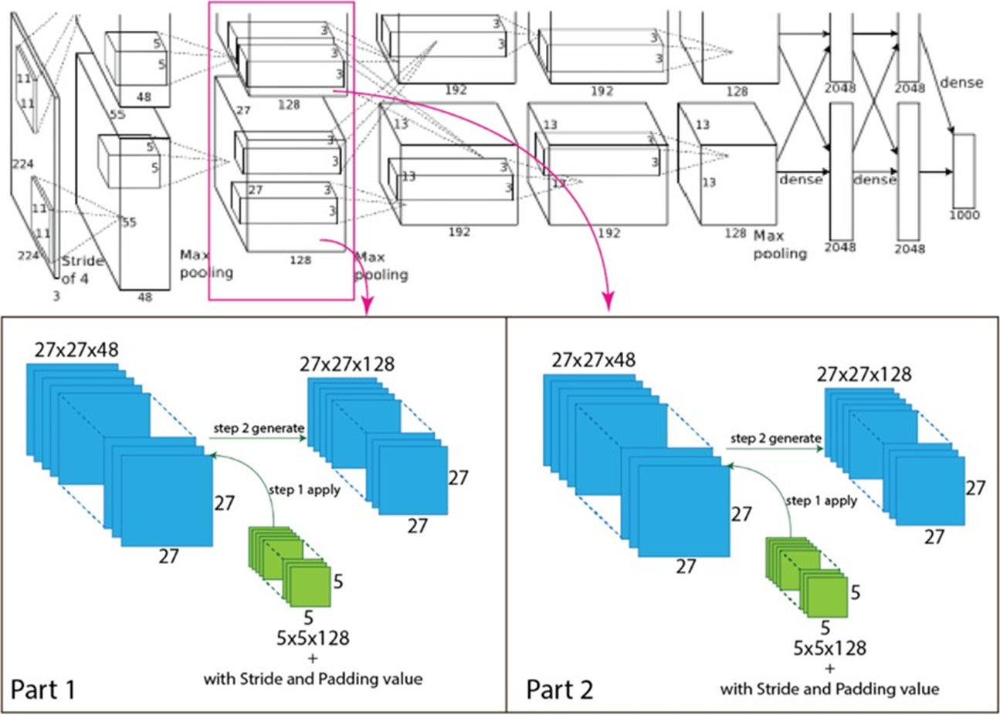
<center>
    <figcaption><b>Figure 19: Internal tranformations during convolutional process and pooling </b></figcaption>
</center>

<h3>Output Dimension Calculation</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Plugging in values:</p>
<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li>Win = 27</li>
    <li>Hin = 27</li>
    <li>K = 5</li>
    <li>S = 1</li>
    <li>P = 2</li>
</ul>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Wout = ((27 + 2*2 - 5) / 1) + 1 = 27<br>
    Hout = ((27 + 2*2 - 5) / 1) + 1 = 27</p>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Output feature map size: 27 x 27 x 256</p>

<h2>Activation Function and LRN</h2>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Similar to the first convolutional layer, a ReLU activation function is applied element-wise. Following this, Local Response Normalization (LRN) is applied to normalize activations across neighboring feature maps.</p>

<h3>Implementation</h3>

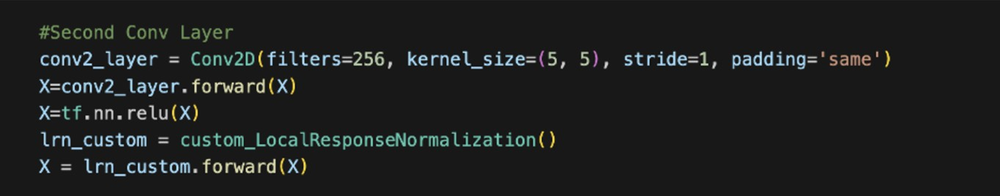


<h2>Second Max Pooling Layer</h2>
<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li>Kernel Size: 3 x 3</li>
    <li>Stride: 2</li>
    <li>Padding: No padding</li>
</ul>

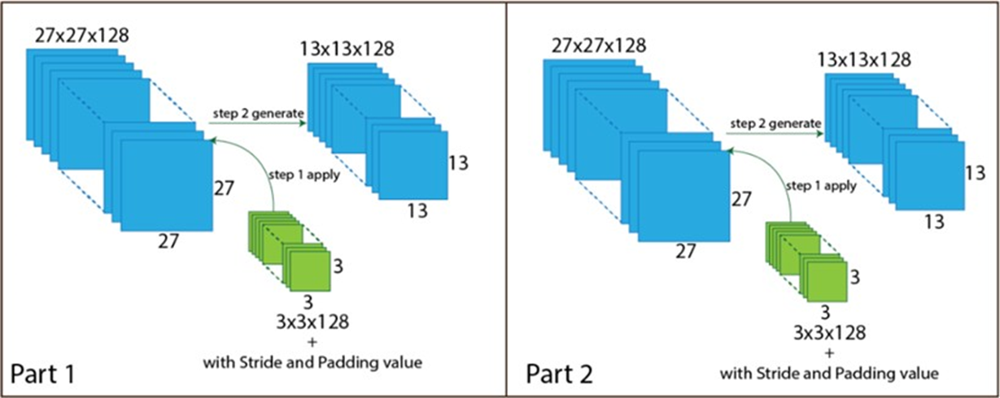
<center>
    <figcaption><b>Figure 20: Internal tranformations during convolutional process and pooling </b></figcaption>
</center>

<h3>Output Dimension Calculation</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Plugging in values:</p>
<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li>Win = 27</li>
    <li>Hin = 27</li>
    <li>K = 3</li>
    <li>S = 2</li>
    <li>P = 0</li>
</ul>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Wout = ((27 + 2*0 - 3) / 2) + 1 = 13<br>
    Hout = ((27 + 2*0 - 3) / 2) + 1 = 13</p>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">This gives us an output feature map size of 13 x 13 for each filter. Since there are 256 filters in the second Max Pooling Layer the output shape of the second pooling layer is 13 x 13 x 256.</p>

<h2>ReLU and LRN</h2>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">
Similar to the first pooling layer, no activation function is applied here, as pooling’s role is primarily down-sampling. Local Response Normalization (LRN) is not used after this pooling layer, as it was only applied in specific layers earlier in the AlexNet architecture.
</p>

<h3>Implementation</h3>

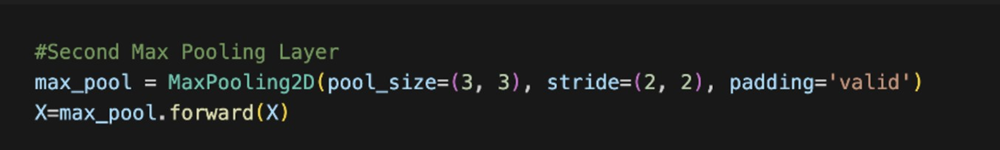

<h3>Third Convolutional Layer</h3>
<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li>Filter (Kernel) Size: 3 x 3</li>
    <li>Stride: 1</li>
    <li>Number of Filters: 384</li>
    <li>Padding: 1 (Same padding)</li>
</ul>

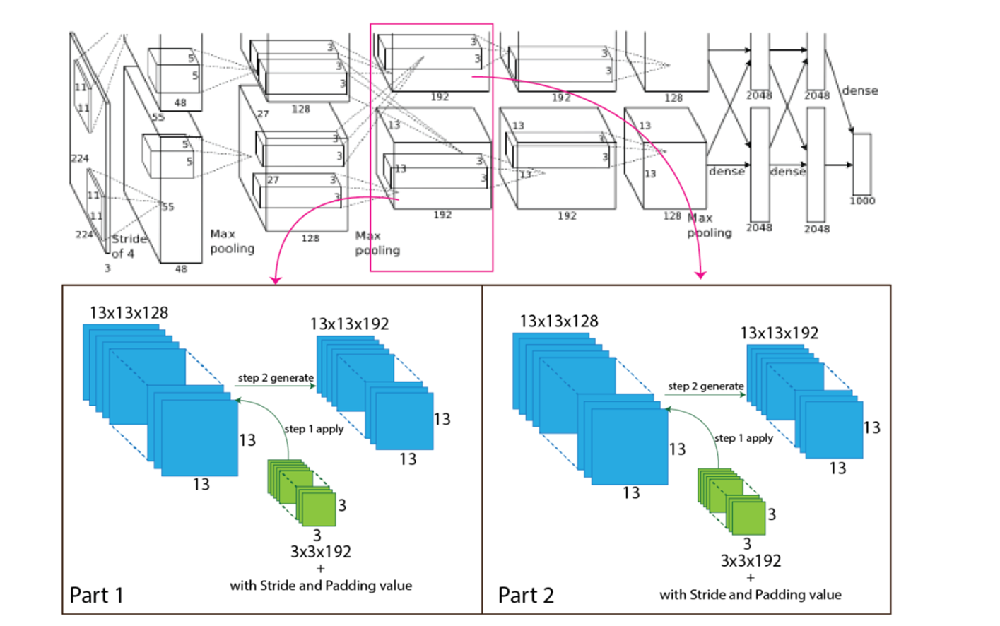
<center>
    <figcaption><b>Figure 21: Internal tranformations during convolutional process and pooling </b></figcaption>
</center>

<h3>Output Dimension Calculation</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Plugging in values:</p>
<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li>Win = 13</li>
    <li>Hin = 13</li>
    <li>K = 3</li>
    <li>S = 1</li>
    <li>P = 1</li>
</ul>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Wout = ((13 + 2*1 - 3) / 1) + 1 = 13<br>
    Hout = ((13 + 2*1 - 3) / 1) + 1 = 13</p>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">This results in an output feature map size of 13 x 13 for each filter.
Since there are 384 filters in this layer, the output shape of the third convolutional layer is 13 x 13 x 384.</p>

<h3>Activation Function and LRM</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">
In this layer, the ReLU activation function is applied after convolution, while Local Response Normalization (LRN) is not utilized.
</p>

<h3>Implementation</h3>

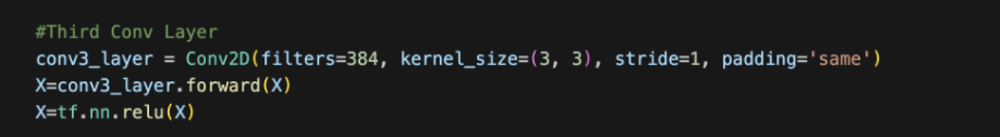


<h2>Fourth Convolutional Layer</h2>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">The fourth convolutional layer in AlexNet takes the output feature map from the third convolutional layer as its input. The parameters for this layer are:</p>

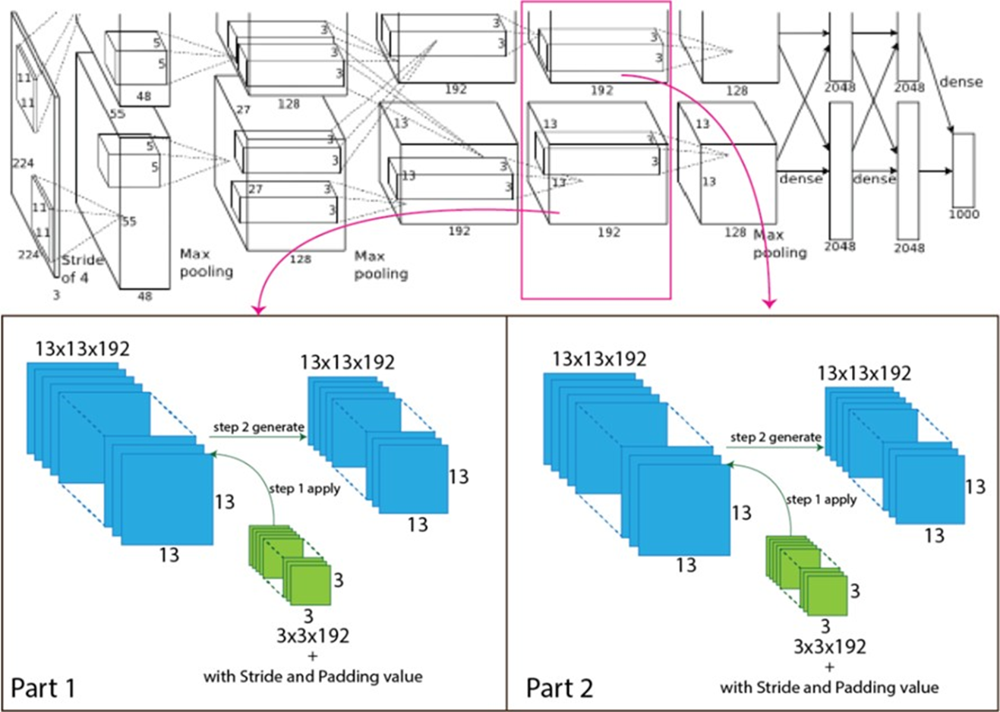
<center>
    <figcaption><b>Figure 22: Internal tranformations during convolutional process and pooling </b></figcaption>
</center>

<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li>Filter (Kernel) Size: 3 x 3</li>
    <li>Stride: 1</li>
    <li>Number of Filters: 384</li>
    <li>Padding: 1 (Same padding)</li>
</ul>
<h3>Operation</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">In this layer, each of the 384 filters (3 x 3 x 384) slides over the feature map produced by the third convolutional layer (13 x 13 x 384). With a padding of 1, the spatial dimensions remain the same as the input, ensuring that the convolution covers the full feature map without any reduction in size.</p>

<h3>Output Dimension Calculation</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"><code>Wout = ((Win + 2P - K) / S) + 1</code><br>
<code>Hout = ((Hin + 2P - K) / S) + 1</code><br>
Plugging in values from the previous layer:</p>
<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li>Win = 13</li>
    <li>Hin = 13</li>
    <li>K = 3</li>
    <li>S = 1</li>
    <li>P = 1</li>
</ul>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"><code>Wout = ((13 + 2*1 - 3) / 1) + 1 = (12) + 1 = 13</code><br>
<code>Hout = ((13 + 2*1 - 3) / 1) + 1 = (12) + 1 = 13</code><br>
This results in an output feature map size of 13 x 13 for each filter.<br>
With 384 filters, the output shape of the fourth convolutional layer is 13 x 13 x 384.</p>

<h3>Activation Function and LRN</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Similar to the last layer, the ReLU activation function is applied after convolution, while Local Response Normalization (LRN) is not utilized.</p>

<h3>Implementation</h3>

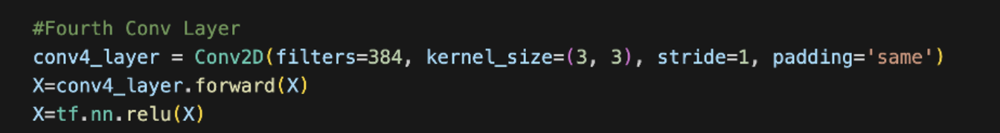


<h2>Fifth Convolutional Layer</h2>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">The fifth convolutional layer in AlexNet takes the output feature map from the fourth convolutional layer as input. The parameters for this layer are:</p>

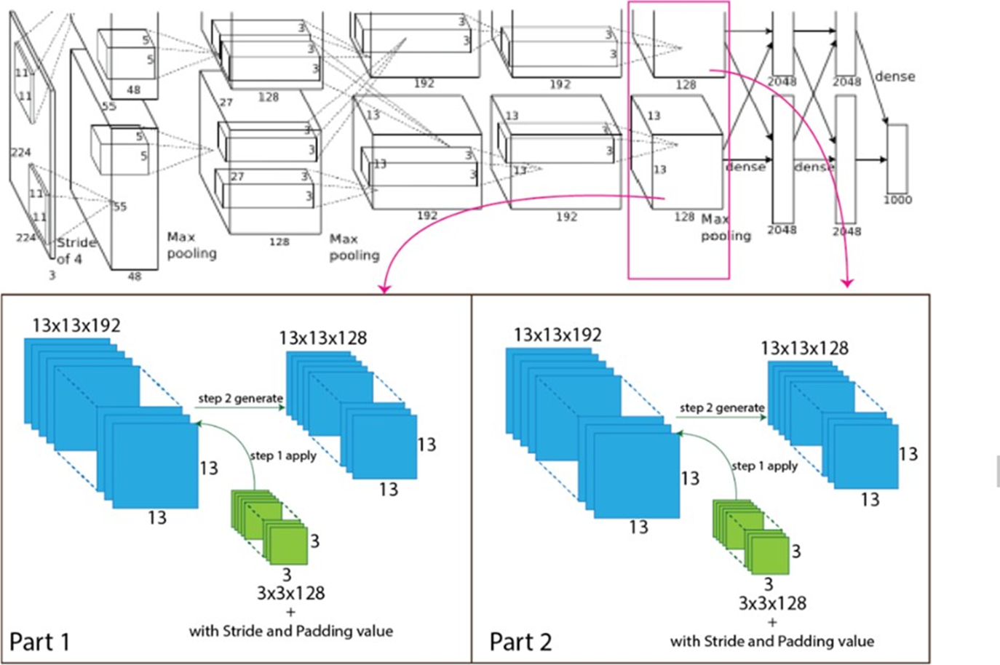

<center>
    <figcaption><b>Figure 23: Internal tranformations during convolutional process and pooling </b></figcaption>
</center>





<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li>Filter (Kernel) Size: 3 x 3</li>
    <li>Stride: 1</li>
    <li>Number of Filters: 256</li>
    <li>Padding: 1 (Same padding)</li>
</ul>
<h3>Operation</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">In this layer, each of the 256 filters (3 x 3 x 384) slides over the feature map produced by the fourth convolutional layer (13 x 13 x 384). The padding of 1 keeps the spatial dimensions of the output feature map the same as the input, so the convolution covers the entire input feature map without reducing its size.</p>

<h3>Output Dimension Calculation</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"><code>Wout = ((Win + 2P - K) / S) + 1</code><br>
<code>Hout = ((Hin + 2P - K) / S) + 1</code><br>
Plugging in values from the previous layer:</p>
<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li>Win = 13</li>
    <li>Hin = 13</li>
    <li>K = 3</li>
    <li>S = 1</li>
    <li>P = 1</li>
</ul>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"><code>Wout = ((13 + 2*1 - 3) / 1) + 1 = (12) + 1 = 13</code><br>
<code>Hout = ((13 + 2*1 - 3) / 1) + 1 = (12) + 1 = 13</code><br>
This results in an output feature map size of 13 x 13 for each filter.<br>
Since there are 256 filters in this layer, the output shape of the fifth convolutional layer is 13 x 13 x 256.</p>

<h3>Activation Function and LRN</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">Similar to the last two layers, the ReLU activation function is applied after convolution, while Local Response Normalization (LRN) is not utilized.</p>

<h3>Implementation</h3>

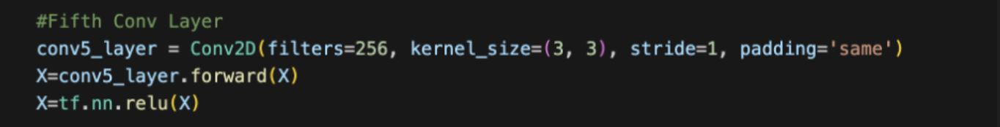

<h2>Third Pooling Layer</h2>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">The third pooling layer in AlexNet performs max pooling on the feature map produced by the fifth convolutional layer to further reduce spatial dimensions while retaining essential features. The parameters for this pooling layer are:</p>

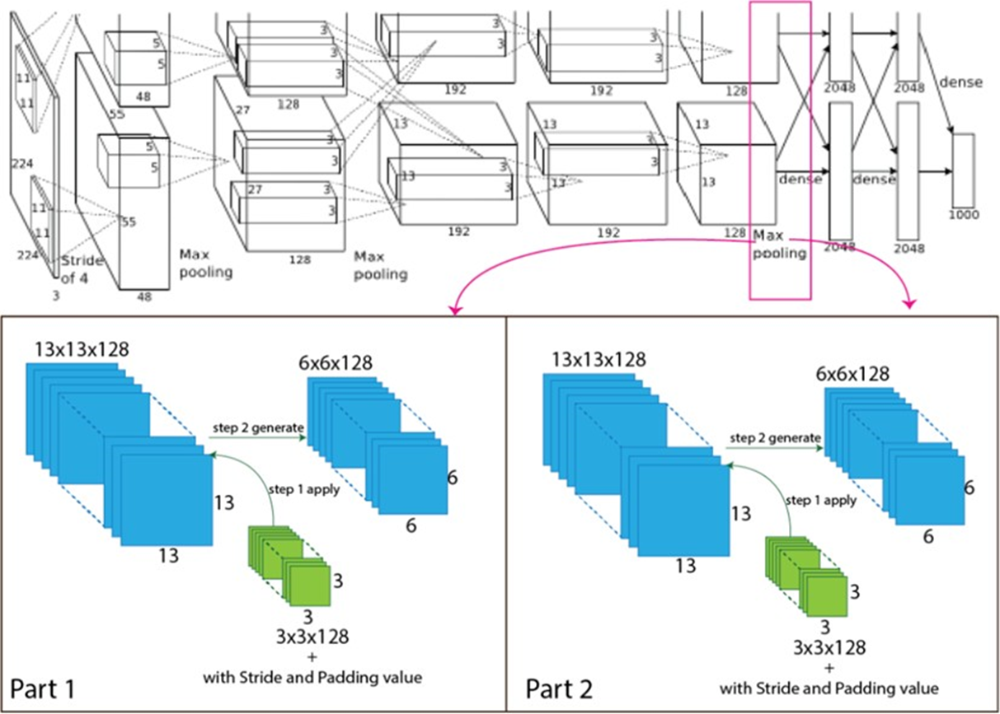
<center>
    <figcaption><b>Figure 24: Internal tranformations during convolutional process and pooling </b></figcaption>
</center>








<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li>Kernel Size: 3 x 3</li>
    <li>Stride: 2</li>
    <li>Padding: No padding</li>
</ul>
<h3>Operation</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">This layer applies a 3 x 3 max pooling filter to the input feature map (13 x 13 x 256) with a stride of 2. The filter slides over the input, selecting the maximum value from each 3 x 3 region, which reduces the spatial dimensions while preserving important features.</p>

<h3>Output Dimension Calculation</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"><code>Wout = ((Win + 2P - K) / S) + 1</code><br>
<code>Hout = ((Hin + 2P - K) / S) + 1</code><br>
Plugging in values from the previous layer:</p>
<ul >
    <li>Win = 13</li>
    <li>Hin = 13</li>
    <li>K = 3</li>
    <li>S = 2</li>
    <li>P = 0</li>
</ul>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"><code>Wout = ((13 + 2*0 - 3) / 2) + 1 = (5) + 1 = 6</code><br>
<code>Hout = ((13 + 2*0 - 3) / 2) + 1 = (5) + 1 = 6</code><br>
This results in an output feature map size of 6 x 6 for each filter.<br>
Since the number of channels (256) is preserved, the output shape of the third pooling layer is 6 x 6 x 256.</p>

<h3>Activation Function and LRN</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">In this layer, no activation function or Local Response Normalization (LRN) is applied. The pooling layer’s sole purpose is to down-sample the feature map.</p>

<h3>Implementation</h3>

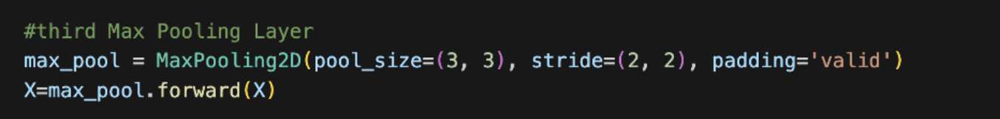


<h2>Fully Connected Layers</h2>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">The next fully connected layers in AlexNet take the flattened output from the final pooling layer (6 x 6 x 256) and transform it into a 1-dimensional vector. These layers are designed to perform high-level reasoning on the features extracted by the convolutional and pooling layers. The first fully connected layer has 4096 neurons, followed by another fully connected layer with 4096 neurons, and finally, a fully connected layer with 1000 neurons corresponding to the number of classes in the dataset. Each of these layers uses the ReLU activation function to introduce non-linearity.</p>

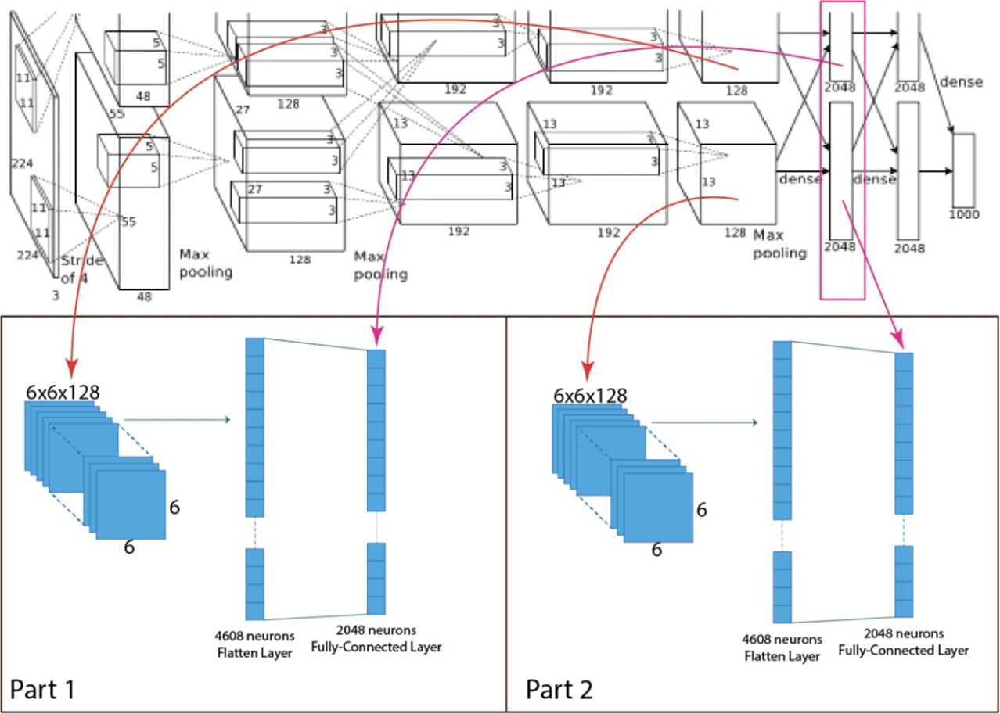
<center>
    <figcaption><b>Figure 26: Internal tranformations in Fully Connected Layers </b></figcaption>
</center>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;"> Computing similarity using Euclidean distance between two 4096-dimensional vectors is inefficient; however, efficiency can be improved by training an auto-encoder to compress these vectors into short binary codes. This approach would enhance image retrieval methods significantly compared to using autoencoders directly on raw pixels, which often fail to retrieve semantically similar images due to their focus on edge patterns alone [2].</p>

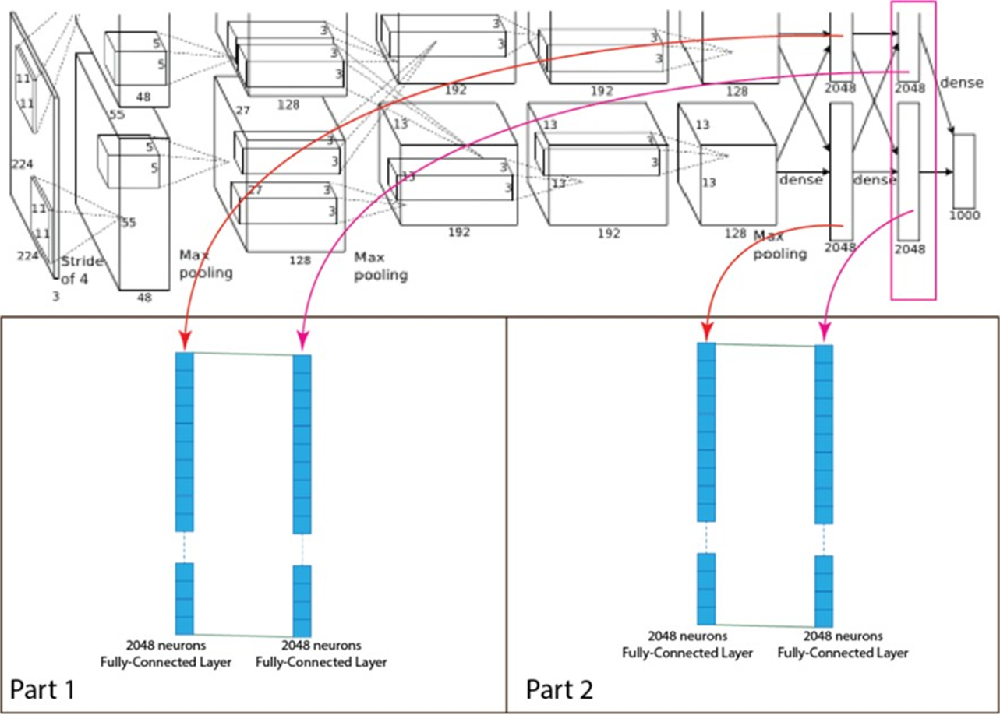


<center>
    <figcaption><b>Figure 27: Internal tranformations in Fully Connected Layers </b></figcaption>
</center>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">To combat overfitting, the authors of AlexNet incorporated the dropout technique. In this method, each neuron has a 50% chance of being temporarily removed from the network during training. This means it won't contribute to either the forward or backward propagation, ensuring that each input is processed by a slightly different network configuration. This makes the learned weight parameters more robust and less prone to overfitting.</p>


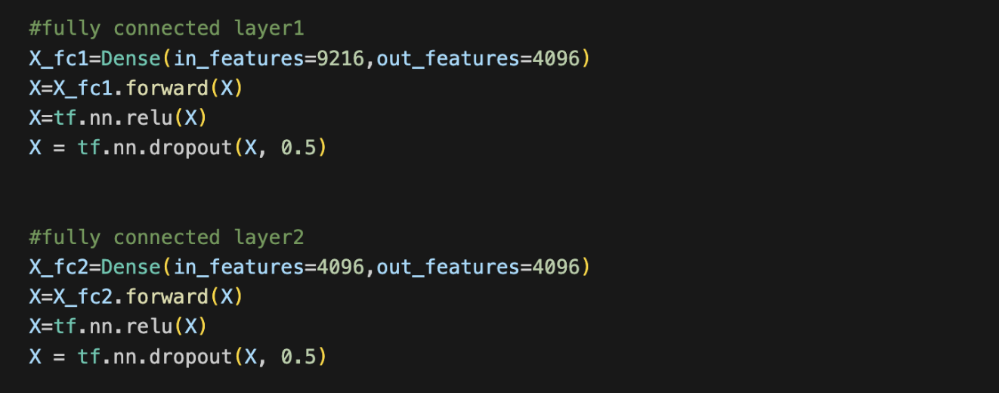


<h2>SoftMax Layer</h2>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"> The final layer in the AlexNet architecture is a fully connected output layer, denoted as "y," which includes 1000 possible outputs using the softmax activation function. The network combines two fully connected layers, each with 2048 neurons, into a single fully connected layer with 4096 neurons. This connects directly to the output layer. The softmax function ensures that the sum of all output layer values ranges between 0 and 1. AlexNet uses a subset of the ImageNet dataset, featuring 1000 output neurons corresponding to classes labeled 0 through 999. To visualize this process, refer to the diagram provided below.</p>

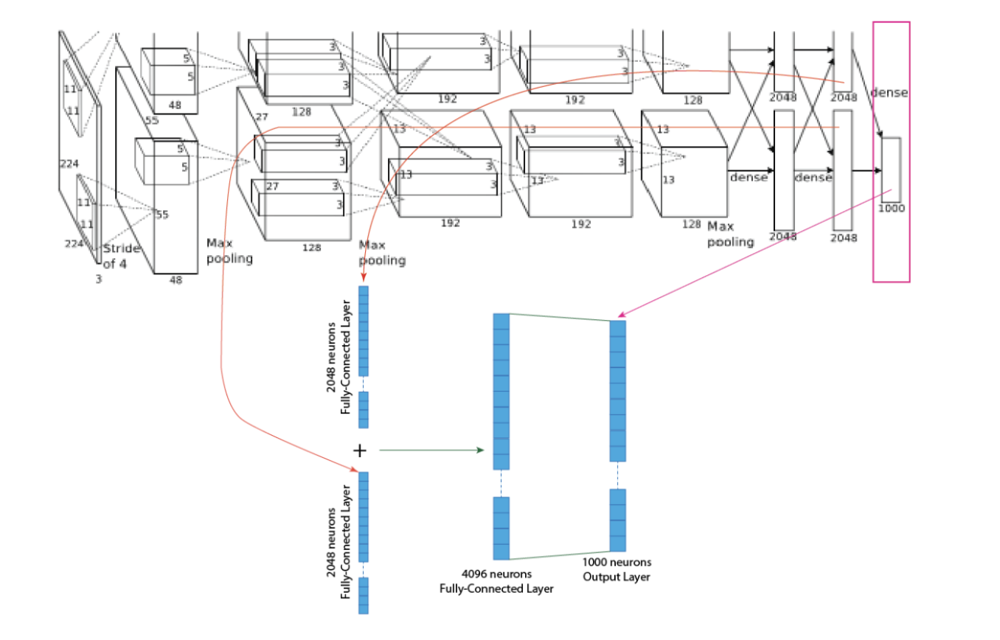

<center>
    <figcaption><b>Figure 28: Internal tranformations in Softmax </b></figcaption>
</center>

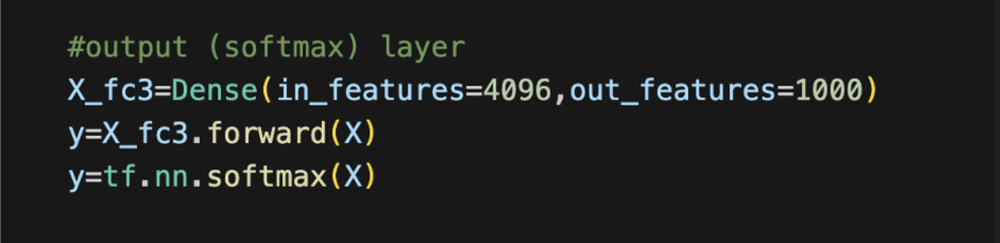

<h2>Sample Execution</h2>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">This sample code execution defines and runs the forward pass of an AlexNet-inspired model. It processes an input image of the same size as AlexNet (227x227x3) through multiple convolutional and pooling layers, followed by fully connected layers to generate class predictions. The model combines feature extraction and classification steps to output a probability distribution over 1000 classes.</p>



In [8]:
from tensorflow.keras import layers
from tensorflow.keras.models import Model
import tensorflow as tf

# Apply ReLU activation in TensorFlow


class AlexNetModel:
    def __init__(self, input_shape=(224,224,3)):
        self.input_shape = input_shape
        #self.model = self.build_model()
        
    def forward(self,X):

        #First Conv Layer
        conv1_layer = Conv2D(filters=96, kernel_size=(11, 11), stride=4, padding='valid')
        X=conv1_layer.forward(X)
        X=tf.nn.relu(X) 
        lrn_custom = custom_LocalResponseNormalization()
        X = lrn_custom.forward(X)


        #First Max Pooling Layer
        max_pool= MaxPooling2D(pool_size=(3,3), stride=(2,2), padding='valid')
        X=max_pool.forward(X)


        #Second Conv Layer
        conv2_layer = Conv2D(filters=256, kernel_size=(5, 5), stride=1, padding='same')
        X=conv2_layer.forward(X)
        X=tf.nn.relu(X) 
        lrn_custom = custom_LocalResponseNormalization()
        X = lrn_custom.forward(X)


        #Second Max Pooling Layer
        max_pool = MaxPooling2D(pool_size=(3, 3), stride=(2, 2), padding='valid')
        X=max_pool.forward(X)


        #Third Conv Layer
        conv3_layer = Conv2D(filters=384, kernel_size=(3, 3), stride=1, padding='same')
        X=conv3_layer.forward(X)
        X=tf.nn.relu(X) 


        #Fourth Conv Layer
        conv4_layer = Conv2D(filters=384, kernel_size=(3, 3), stride=1, padding='same')
        X=conv4_layer.forward(X)
        X=tf.nn.relu(X) 

        #Fifth Conv Layer
        conv5_layer = Conv2D(filters=256, kernel_size=(3, 3), stride=1, padding='same')
        X=conv5_layer.forward(X)
        X=tf.nn.relu(X) 

        #third Max Pooling Layer
        max_pool = MaxPooling2D(pool_size=(3, 3), stride=(2, 2), padding='valid')
        X=max_pool.forward(X)

        X=X.flatten()  #flattening to make it compatible for fully connected layers


        #fully connected layer1
        X_fc1=Dense(in_features=9216,out_features=4096)        
        X=X_fc1.forward(X)
        X=tf.nn.relu(X)
        X = tf.nn.dropout(X, 0.5) 
        

        #fully connected layer2
        X_fc2=Dense(in_features=4096,out_features=4096)
        X=X_fc2.forward(X)
        X=tf.nn.relu(X)
        X = tf.nn.dropout(X, 0.5) 



        #output (softmax) layer
        X_fc3=Dense(in_features=4096,out_features=1000)
        y=X_fc3.forward(X)

        y=tf.nn.softmax(y)

        return y

    def summary(self):
        return self.model.summary()

# Instantiate the AlexNet model class and print the summary
X=np.random.randn(227,227,3)
alexnet = AlexNetModel()
y=alexnet.forward(X)
y.shape
#alexnet.summary()



TensorShape([1, 1000])

<a id="Model_Training" style="color: black; text-decoration: none;"><h1>Part 2: Model Training</h1></a>


<a id="Batch_Size" style="color: black; text-decoration: none;"><h2>Batch Size</h2></a>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">
    We have used a batch size of 2, meaning that the model will process two samples at a time before updating its weights. This small batch size results in more frequent updates, potentially leading to a more dynamic learning process. Small batch sizes can help the model capture fine-grained patterns and avoid local minima but may also introduce more noise in updates.
</p>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">
    <strong>Iterability:</strong> The batch size is set to be adjustable, allowing for modifications based on memory constraints or performance requirements. Small batch sizes like 2 can be effective when working with limited memory or large models, though they may increase training time due to the larger number of iterations per epoch.
</p>


<a id="Training_AlexNet" style="color: black; text-decoration: none;"><h2>Defining the model - AlexNet</h2></a>



In [9]:
def compile_and_train_alexnet(model, initial_lr=0.01, decay=0.0005, patience=10, min_lr=1e-6):
    """
    Compiles and trains an AlexNet model using SGD optimizer with a ReduceLROnPlateau learning rate scheduler.

    Parameters:
    - model: The uncompiled AlexNet model.
    - initial_lr (float): Starting learning rate for the optimizer.
    - decay (float): Weight decay parameter for regularization.
    - patience (int): Number of epochs with no improvement after which learning rate will be reduced.
    - min_lr (float): Minimum learning rate for the scheduler.

    Returns:
    - model: The compiled model ready for training.
    """

    # Define the SGD optimizer with the specified initial learning rate and weight decay
    sgd_optimizer = tf.keras.optimizers.SGD(
        learning_rate=initial_lr,
        weight_decay=decay,
        nesterov=False  # Nesterov momentum is not used
    )

    # Compile the model with the defined optimizer, categorical crossentropy loss, and accuracy metric
    model.compile(
        optimizer=sgd_optimizer,
        loss="categorical_crossentropy",
        metrics=["accuracy"]
    )

    # Set up a ReduceLROnPlateau callback to reduce the learning rate by a factor of 10 when validation loss plateaus
    lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss",  # Monitor the validation loss to determine when to adjust learning rate
        factor=0.1,          # Reduce learning rate by a factor of 10
        patience=patience,   # Number of epochs with no improvement before reducing the learning rate
        min_lr=min_lr        # Set a floor for the learning rate
    )

    # Display model architecture
    model.summary()

    return model, lr_scheduler


<a id="SGD_Optimizer" style="color: black; text-decoration: none;"><h2>SGD Optimizer and Learning Rate Scheduler</h2></a>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">
    The training configuration starts with an SGD (Stochastic Gradient Descent) optimizer, a foundational optimization technique for AlexNet, originally used to balance efficient learning with robust convergence:
    <ul style="font-family: Arial, sans-serif; font-size: 16px;line-height: 1.6; ">
        <li><strong>Learning Rate:</strong> The initial learning rate is set to 0.01, establishing a balanced pace for learning across layers. This learning rate works effectively with AlexNet’s architecture, which includes large fully connected layers that benefit from controlled, steady updates.</li>
        <li><strong>Weight Decay:</strong> A small weight decay value of 0.0005 is applied, aligning with AlexNet’s original design to prevent overfitting in large, deep networks. This regularization technique discourages overly large weights by penalizing them slightly, promoting a more generalized model.</li>
    </ul>
</p>

<h3>Model Compilation:</h3>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">
    The AlexNet model is compiled with settings specifically suited for multi-class image classification:
    <ul style="font-family: Arial, sans-serif; font-size: 16px;line-height: 1.6; ">
        <li><strong>Loss Function:</strong> <code>categorical_crossentropy</code>, a standard for multi-class classification, ensures the model learns by minimizing the difference between predicted and true class probabilities.</li>
        <li><strong>Metrics:</strong> <code>accuracy</code> is selected as a metric to directly monitor the model’s classification performance, enabling clear tracking of how well AlexNet learns to distinguish between image classes.</li>
    </ul>
</p>

<h3>Learning Rate Scheduler:</h3>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">
    A <code>ReduceLROnPlateau</code> callback is set up, ensuring that the learning rate adapts based on the model’s validation performance (<code>val_loss</code>), which is crucial for AlexNet’s convergence:
    <ul style="font-family: Arial, sans-serif; font-size: 16px;line-height: 1.6; ">
        <li><strong>Factor:</strong> If the validation loss does not improve for a set number of epochs (<code>patience=10</code>), the learning rate is reduced by a factor of 0.1. This gradual decrease is essential for AlexNet’s large network structure, helping the model settle into a solution by slowing down learning when further improvements are harder to achieve.</li>
        <li><strong>Minimum Learning Rate:</strong> The scheduler will not allow the learning rate to fall below <code>1e-6</code>. This minimum limit is crucial in AlexNet to prevent overly small learning rates, which can cause the model to stop improving.</li>
    </ul>
</p>

<h3>Return Values:</h3>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">
    The function returns the compiled AlexNet model along with a learning rate scheduler ready for use in training (via <code>model.fit</code>). This setup supports AlexNet’s need for dynamic learning rate adjustments, aiding in smooth and efficient convergence. The scheduler’s design reduces the learning rate when necessary, allowing AlexNet to fine-tune its parameters as it progresses, resulting in improved model performance and stability.
</p>


<a id="Training_the_Model" style="color: black; text-decoration: none;"><h2>Training the Model with Callbacks for Checkpointing, Early Stopping, and Learning Rate Adjustment</h2></a>

In [10]:
def train_model_with_callbacks(model, train_data, valid_data, checkpoint_dir, lr_scheduler, patience=10, epochs=50):
    """
    Train the model with callbacks for checkpointing, early stopping, and learning rate reduction.
    
    Args:
        model: The model to be trained.
        train_data: The training dataset.
        valid_data: The validation dataset.
        checkpoint_dir: Directory where the model checkpoints will be saved.
        lr_scheduler: Learning rate scheduler callback.
        patience: Patience for early stopping, default is 10.
        epochs: Number of epochs to train the model, default is 50.
    
    Returns:
        model_fit: The result of model training (fit history).
    """
    
    # Define the checkpoint path with epoch in the filename
    checkpoint_path = os.path.join(checkpoint_dir, "cp-{epoch:04d}.weights.h5")  # creates the checkpoint at epoch level

    # Callbacks for Checkpointing
    cp_callback = tf.keras.callbacks.ModelCheckpoint(
        checkpoint_path, verbose=1, save_weights_only=True
    )

    # Callbacks for EarlyStopping
    es = tf.keras.callbacks.EarlyStopping(patience=patience, monitor="loss")

    # Train the model
    model_fit = model.fit(
        train_data,
        validation_data=valid_data,
        epochs=epochs,
        callbacks=[es, cp_callback, lr_scheduler]
    )
    
    return model_fit


<h2>Purpose:</h2>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">The <strong>train_model_with_callbacks</strong> function is designed to train a given model using the specified training and validation datasets while incorporating various callbacks to enhance the training process. This function integrates <strong>ModelCheckpoint</strong> for saving the model’s weights at different epochs, <strong>EarlyStopping</strong> for preventing overfitting by halting training when no improvement is observed, and <strong>LearningRateScheduler</strong> for adjusting the learning rate based on the model's performance.</p>

<h2>Arguments:</h2>
<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;">
    <li><strong>model</strong> (<em>tf.keras.Model</em>): The neural network model to be trained. This should be a compiled Keras model.</li>
    <li><strong>train_data</strong> (<em>tf.data.Dataset or numpy.ndarray</em>): The dataset used for training the model. This should be preprocessed and normalized to the required format.</li>
    <li><strong>valid_data</strong> (<em>tf.data.Dataset or numpy.ndarray</em>): The dataset used for validating the model during training. It should be formatted similarly to the training data for proper validation.</li>
    <li><strong>checkpoint_dir</strong> (<em>str</em>): The directory path where the model checkpoints (saved weights) will be stored. The function will automatically append the epoch number to the checkpoint file names.</li>
    <li><strong>lr_scheduler</strong> (<em>tf.keras.callbacks.Callback</em>): A learning rate scheduler callback, such as ReduceLROnPlateau, that adjusts the learning rate during training based on certain conditions (e.g., when validation loss does not improve).</li>
    <li><strong>patience</strong> (<em>int, default=10</em>): The number of epochs with no improvement in the monitored metric (e.g., loss) before triggering early stopping. A value of 10 means the training will stop if no improvement is seen in 10 consecutive epochs.</li>
    <li><strong>epochs</strong> (<em>int, default=50</em>): The number of epochs to train the model. This is the total number of passes through the entire dataset for training.</li>
</ul>

<h2>Returns:</h2>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"><strong>model_fit</strong> (<em>tf.keras.callbacks.History</em>): The result of the <code>model.fit()</code> call, which contains the training history, including the loss and accuracy metrics recorded during training. This object can be used for further analysis or plotting the training progress.</p>

<h2>Process:</h2>
<h3>Checkpointing:</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">The function creates a checkpoint path using the provided <strong>checkpoint_dir</strong> and saves the model’s weights at each epoch (using the format <code>cp-{epoch:04d}.weights.h5</code>). The <strong>ModelCheckpoint</strong> callback is used to periodically save the model weights during training, ensuring that progress is not lost.</p>

<h3>Early Stopping:</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">The <strong>EarlyStopping</strong> callback monitors the training loss and halts training if there is no improvement in the loss for a specified number of epochs (<strong>patience</strong>). This prevents unnecessary training and potential overfitting.</p>

<h3>Learning Rate Scheduling:</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">The learning rate is adjusted dynamically using the provided <strong>lr_scheduler</strong> callback, based on the model's performance on the validation set. This helps in optimizing the learning process by reducing the learning rate when needed.</p>

<h3>Model Training:</h3>
<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">The <code>model.fit()</code> function is called with the training and validation data, specifying the number of epochs, and the callbacks. The training process is carried out with real-time monitoring and adjustments based on the callbacks.</p>


<a id="Real_World_Example" style="color: black; text-decoration: none;"><h1>Part 3: A Real World Example</h1></a>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"> We can begin by trying out a sample task using mini Imagenet dataset contain 16 classes. The following categories are considered for the analysis:
    
    ['tench', 'goldfish', 'great_white_shark', 'tiger_shark', 'hammerhead', 'electric_ray','stingray', 'cock', 'hen', 'ostrich', 'brambling', 'goldfinch','house_finch', 'junco', 'indigo_bunting','robin']

</p>



<a id="Data_Loading" style="color: black; text-decoration: none;"><h2>Data Loading - Mini ImageNet of 16 Classes</h2></a>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"> We will be loading the data using <b>tf.keras.preprocessing.image_dataset_from_directory</b>  </p>

<h3> Data Augmentation while reading the data </h3>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;"> In the paper, the downsampling technique used resizes the images so that the shortest side is scaled to 224 pixels while maintaining the aspect ratio. Here’s a step-by-step outline for implementing this:
<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6;text-align: justify;">
    <li><strong>Rescale to Shortest Side:</strong> Resize the image such that the shortest side is 224 pixels, while maintaining the original aspect ratio. This avoids distortion by not forcing the image into a 224x224 square immediately.</li>
    <li><strong>Center Crop (Optional):</strong> After resizing, you can center crop the image to a 224x224 square if a square input is required for the model. </li>
    
</ul>
</p>

<h3> Splitting the dataset into train and Validation </h3>

- seed = 123
- validation_split_ratio = 0.1

In [11]:
img_height = 224
img_width = 224
batch_size = 2  # '2' because we have a small set of samples

In [12]:
df_train = tf.keras.preprocessing.image_dataset_from_directory(
    "Imagenet_mini/train",
    labels="inferred",  # Automatically labels are picked based on the sub_directories name
    label_mode="categorical",  # labels are encoded as a categorical vector(for categorical loss )
    # class_names = ['tench', 'goldfish', 'great_white_shark', 'tiger_shark', 'hammerhead', 'electric_ray',
    #               'stingray', 'cock', 'hen', 'ostrich', 'brambling', 'goldfinch','house_finch', 'junco', 'indigo_bunting',
    #                'robin'], # This is the explicit list of class names (must match names of subdirectories)
    color_mode="rgb",
    batch_size=batch_size,
    image_size=(
        img_height,
        img_width,
    ),  # Size to resize images to after they are read from disk,
    shuffle=True,
    seed=123,
    validation_split=0.1,
    subset="training",
)

Found 513 files belonging to 16 classes.
Using 462 files for training.


In [13]:
df_valid = tf.keras.preprocessing.image_dataset_from_directory(
    "Imagenet_mini/train",
    labels="inferred",  # Automatically labels are picked based on the sub_directories name
    label_mode="categorical",  # labels are encoded as a categorical vector(for categorical loss )
    # class_names = ['tench', 'goldfish', 'great_white_shark', 'tiger_shark', 'hammerhead', 'electric_ray',
    #               'stingray', 'cock', 'hen', 'ostrich', 'brambling', 'goldfinch','house_finch', 'junco', 'indigo_bunting',
    #                'robin'], # This is the explicit list of class names (must match names of subdirectories)
    color_mode="rgb",
    batch_size=batch_size,
    image_size=(
        img_height,
        img_width,
    ),  # Size to resize images to after they are read from disk,
    shuffle=True,
    seed=123,
    validation_split=0.1,
    subset="validation",
)

Found 513 files belonging to 16 classes.
Using 51 files for validation.


<h2> Sample Visualization of Training dataset after Resizing Images </h2>

2024-11-17 19:21:43.036463: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


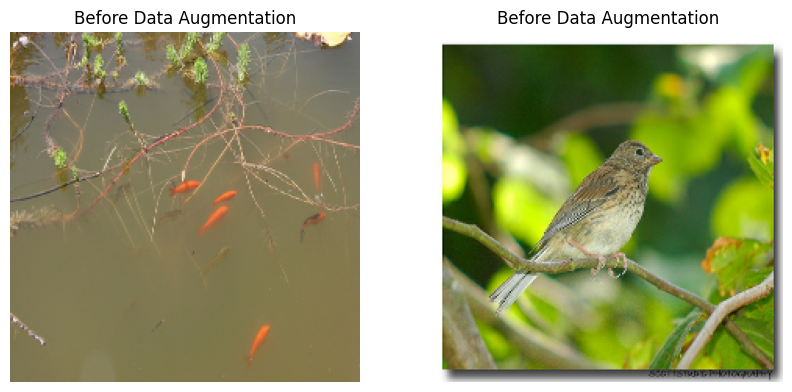

In [23]:
plt.figure(figsize=(10, 10))
for images, labels in df_train.take(1):
    for i in range(2):
        ax = plt.subplot(2, 2, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title("Before Data Augmentation")  # Add this line
        plt.axis("off")
plt.show()

<a id="Data_Augumentation_data" style="color: black; text-decoration: none;"><h2> Data Augmentation(Post loading the Images)</h2></a>

### 1. Mean Normalization
- First, we have to calculate dataset mean and standard deviation
- Normalizing each image using calculated mean 

In [15]:
def calculate_mean_std(dataset):
    pixel_sum, pixel_square_sum, num_pixels = 0.0, 0.0, 0
    for image, _ in dataset:
        pixel_sum += tf.reduce_sum(image)
        pixel_square_sum += tf.reduce_sum(tf.square(image))
        num_pixels += tf.size(image)

    mean = pixel_sum / tf.cast(num_pixels, tf.float32)
    std_dev = tf.sqrt(
        pixel_square_sum / tf.cast(num_pixels, tf.float32) - tf.square(mean)
    )
    return mean, std_dev

In [16]:
def normalize_image(image, mean, std_dev):
    # Subtract mean and divide by standard deviation
    return image - mean

In [17]:
# Calculate mean and standard deviation from the training dataset
mean, std_dev = calculate_mean_std(df_train)


# Function to normalize image
def normalize_image_dataset(image, label):
    image = normalize_image(image, mean, std_dev)
    return image, label

2024-11-17 19:20:31.038529: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


### 2.Horizontal reflections

In [18]:
def horizontal_reflection(image, label):
    image = tf.image.flip_left_right(image)
    return image, label

### 3.Altering the Intensities

In [19]:
def adjusting_brightness(image, label):
    image = tf.image.adjust_brightness(image, 0.2)
    return image, label

In [20]:
def DataAugmentation(dataset):

    # Applying Mean Normalization
    dataset = dataset.map(normalize_image_dataset, num_parallel_calls=tf.data.AUTOTUNE)

    # Applying Horizontal flip
    dataset = dataset.map(horizontal_reflection, num_parallel_calls=tf.data.AUTOTUNE)

    # Applying Adjusting Brightness
    # dataset = dataset.map(adjusting_brightness, num_parallel_calls = tf.data.AUTOTUNE)

    return dataset

In [21]:
normalized_train_df = DataAugmentation(df_train)
# Optimizing Purpose
normalized_train_df = normalized_train_df.prefetch(tf.data.AUTOTUNE)


normalized_valid_df = DataAugmentation(df_valid)
# Optimizing Purpose
normalized_valid_df = normalized_valid_df.prefetch(tf.data.AUTOTUNE)

<h2> Sample Visualization of Training dataset post full data Augmentation </h2>

2024-11-17 19:21:49.782143: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


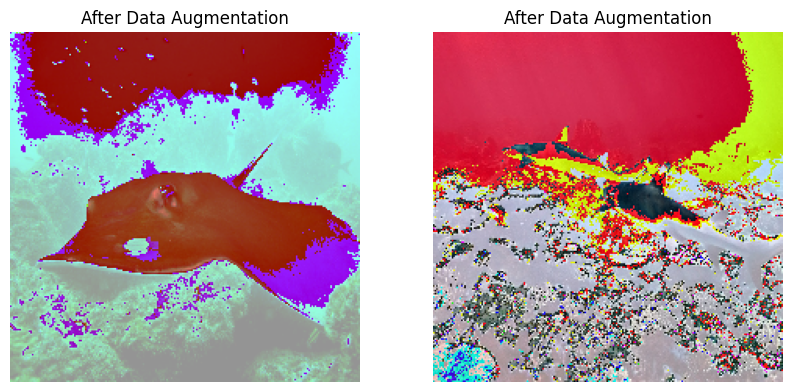

In [24]:
plt.figure(figsize=(10, 10))
for images, labels in normalized_train_df.take(1):
    for i in range(2):
        ax = plt.subplot(2, 2, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title("After Data Augmentation")
        plt.axis("off")


<a id="Training_System" style="color: black; text-decoration: none;"><h2>AlexNet Model</h2></a>

In [27]:
model = tf.keras.models.Sequential(
    [
        # 1st conv
        tf.keras.layers.Conv2D(
            96, (11, 11), strides=(4, 4), activation="relu", input_shape=(224, 224, 3)
        ),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D(3, strides=(2, 2)),  # Overlap Pooling layer
        # 2nd conv
        tf.keras.layers.Conv2D(
            256, (5, 5), strides=(1, 1), activation="relu", padding="same"
        ),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D(3, strides=(2, 2)),  # Overlap Pooling layer
        # 3rd conv
        tf.keras.layers.Conv2D(
            384, (3, 3), strides=(1, 1), activation="relu", padding="same"
        ),
        tf.keras.layers.BatchNormalization(),
        # 4th conv
        tf.keras.layers.Conv2D(
            384, (3, 3), strides=(1, 1), activation="relu", padding="same"
        ),
        tf.keras.layers.BatchNormalization(),
        # 5th Conv
        tf.keras.layers.Conv2D(
            256, (3, 3), strides=(1, 1), activation="relu", padding="same"
        ),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D(3, strides=(2, 2)),  # Overlap Pooling layer
        # To Flatten layer
        tf.keras.layers.Flatten(),
        # To FC layer 1
        tf.keras.layers.Dense(4096, activation="relu"),
        tf.keras.layers.Dropout(0.5),
        # To FC layer 2
        tf.keras.layers.Dense(4096, activation="relu"),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(16, activation="softmax"),
    ]
)



<a id="Training_the_model" style="color: black; text-decoration: none;"><h2>Model Setup and Training Configuration</h2></a>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; padding: 10px 0;text-align: justify;">As per the paper, we are configuring a Alexnet model, by defining the SGD optimizer with an initial learning rate of 0.01, supplemented by a weight decay of 0.0005 for regularization to prevent overfitting. The model is compiled using categorical cross-entropy as the loss function, suitable for multi-class problems, and accuracy as the performance metric. To improve convergence, we implement a ReduceLROnPlateau callback that dynamically reduces the learning rate by a factor of 0.1 if validation loss does not improve for 10 consecutive epochs, ensuring that training remains effective without excessively low learning rates. Finally, the model.summary() function provides a detailed architectural overview, listing each layer’s type, output shape, and parameter count, which is valuable for documentation and model assessment. This setup supports adaptive learning, regularization, and consistent monitoring, forming a robust foundation for model training and evaluation.</p>

In [28]:
def compile_and_train_alexnet(model, initial_lr=0.01, decay=0.0005, patience=10, min_lr=1e-6):
    """
    Compiles and trains an AlexNet model using SGD optimizer with a ReduceLROnPlateau learning rate scheduler.

    Parameters:
    - model: The uncompiled AlexNet model.
    - initial_lr (float): Starting learning rate for the optimizer.
    - decay (float): Weight decay parameter for regularization.
    - patience (int): Number of epochs with no improvement after which learning rate will be reduced.
    - min_lr (float): Minimum learning rate for the scheduler.

    Returns:
    - model: The compiled model ready for training.
    """

    # Define the SGD optimizer with the specified initial learning rate and weight decay
    sgd_optimizer = tf.keras.optimizers.SGD(
        learning_rate=initial_lr,
        weight_decay=decay,
        nesterov=False  # Nesterov momentum is not used
    )

    # Compile the model with the defined optimizer, categorical crossentropy loss, and accuracy metric
    model.compile(
        optimizer=sgd_optimizer,
        loss="categorical_crossentropy",
        metrics=["accuracy"]
    )

    # Set up a ReduceLROnPlateau callback to reduce the learning rate by a factor of 10 when validation loss plateaus
    lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss",  # Monitor the validation loss to determine when to adjust learning rate
        factor=0.1,          # Reduce learning rate by a factor of 10
        patience=patience,   # Number of epochs with no improvement before reducing the learning rate
        min_lr=min_lr        # Set a floor for the learning rate
    )

    # Display model architecture
    model.summary()

    return model, lr_scheduler

In [29]:
model, lr_scheduler = compile_and_train_alexnet(model)

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 54, 54, 96)     │        34,944 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 54, 54, 96)     │           384 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 26, 26, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 26, 26, 256)    │       614,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 26, 26, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 12, 12, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 12, 12, 384)    │       885,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 12, 12, 384)    │         1,536 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 12, 12, 384)    │     1,327,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 12, 12, 384)    │         1,536 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 12, 12, 256)    │       884,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 12, 12, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 5, 5, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 6400)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4096)           │    26,218,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 16)             │        65,552 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 46,818,064 (178.60 MB)

 Trainable params: 46,815,312 (178.59 MB)

 Non-trainable params: 2,752 (10.75 KB)




<a id="Model_checking" style="color: black; text-decoration: none;"><h2>Model Checkpointing, Early Stopping, and Training Configuration</h2></a>



In [30]:
def train_model_with_callbacks(model, train_data, valid_data, checkpoint_dir, lr_scheduler, patience=10, epochs=50):
    """
    Train the model with callbacks for checkpointing, early stopping, and learning rate reduction.
    
    Args:
        model: The model to be trained.
        train_data: The training dataset.
        valid_data: The validation dataset.
        checkpoint_dir: Directory where the model checkpoints will be saved.
        lr_scheduler: Learning rate scheduler callback.
        patience: Patience for early stopping, default is 10.
        epochs: Number of epochs to train the model, default is 50.
    
    Returns:
        model_fit: The result of model training (fit history).
    """
    
    # Define the checkpoint path with epoch in the filename
    checkpoint_path = os.path.join(checkpoint_dir, "cp-{epoch:04d}.weights.h5")  # creates the checkpoint at epoch level

    # Callbacks for Checkpointing
    cp_callback = tf.keras.callbacks.ModelCheckpoint(
        checkpoint_path, verbose=1, save_weights_only=True
    )

    # Callbacks for EarlyStopping
    es = tf.keras.callbacks.EarlyStopping(patience=patience, monitor="loss")

    # Train the model
    model_fit = model.fit(
        train_data,
        validation_data=valid_data,
        epochs=epochs,
        callbacks=[es, cp_callback, lr_scheduler]
    )
    
    return model_fit

In [31]:
model_fit_1 = train_model_with_callbacks(model= model,
                           train_data= normalized_train_df,
                           valid_data= normalized_valid_df,
                           checkpoint_dir="model_training_excAdjBrig_incWeiDec",
                           lr_scheduler= lr_scheduler,
                           patience=10, 
                           epochs=50)

Epoch 1/50
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.0680 - loss: 30.1693
Epoch 1: saving model to model_training_excAdjBrig_incWeiDec/cp-0001.weights.h5
231/231 ━━━━━━━━━━━━━━━━━━━━ 19s 80ms/step - accuracy: 0.0680 - loss: 30.1090 - val_accuracy: 0.1176 - val_loss: 4.3790 - learning_rate: 0.0100
Epoch 2/50
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.0844 - loss: 5.3418
Epoch 2: saving model to model_training_excAdjBrig_incWeiDec/cp-0002.weights.h5
231/231 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - accuracy: 0.0844 - loss: 5.3394 - val_accuracy: 0.0588 - val_loss: 3.5982 - learning_rate: 0.0100
Epoch 3/50
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.0961 - loss: 3.8792
Epoch 3: saving model to model_training_excAdjBrig_incWeiDec/cp-0003.weights.h5
231/231 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - accuracy: 0.0960 - loss: 3.8785 - val_accuracy: 0.0784 - val_loss: 3.3251 - learning_rate: 0.0100
Epoch 4/50
231/231 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.1


<a id="Evaluation" style="color: black; text-decoration: none;"><h2>Evaluation</h2></a>



In [32]:
# Evaluate the Training model
loss, acc = model.evaluate(normalized_train_df, verbose=2)
print("Trained model, accuracy: {:5.2f}%".format(100 * acc))

231/231 - 4s - 19ms/step - accuracy: 0.8182 - loss: 0.7818
Trained model, accuracy: 81.82%


In [33]:
# Evaluate the Validation model
loss, acc = model.evaluate(normalized_valid_df, verbose=2)
print("Trained model, accuracy: {:5.2f}%".format(100 * acc))

26/26 - 1s - 20ms/step - accuracy: 0.2353 - loss: 2.6801
Trained model, accuracy: 23.53%


<a id="Conclusion" style="color: black; text-decoration: none;"><h1>Discussion</h1></a>

<a id="Observations" style="color: black; text-decoration: none;"><h2>Observations</h2></a>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; text-align: justify;">These highlight the innovations and architectural choices that have contributed to AlexNet's effectiveness and its pioneering status in the field of deep learning.</p>
<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; text-align: justify;">
    <li><b>Similarity Measures in Feature Space:</b> AlexNet uses the 4096-dimensional feature vectors from its last hidden layer to measure similarity between images. By calculating the Euclidean distance between these vectors, the network can identify images that are semantically similar even if their pixel-level details differ significantly. This demonstrates the network's ability to abstract and understand the content of images beyond mere visual similarity.</li>
    <li><b>Image Retrieval:</b> The method described for image retrieval showcases the practical application of AlexNet’s feature extraction capabilities. The network can recognize and retrieve images that are contextually similar to a given image, which is crucial for tasks like digital image sorting, search engines, and automated tagging systems.</li>
    <li><strong>Deep Layered Structure:</strong> AlexNet consists of eight layers with weights; five convolutional layers followed by three fully connected layers, showcasing a deeper structure than most prior networks, which allows it to learn a complex hierarchy of features.</li>
    <li><strong>Use of ReLU Activation Function:</strong> It employs the Rectified Linear Unit (ReLU) activation function for non-linear processing, which helps in faster training by avoiding the vanishing gradient problem common with sigmoid and tanh functions.</li>
    <li><strong>Local Response Normalization (LRN):</strong> AlexNet incorporates LRN, which normalizes the activities of neurons across channels, enhancing model generalization by promoting inhibited responses to weak inputs.</li>
    <li><strong>Overlapping Pooling:</strong> The network uses overlapping pooling layers which reduces the size of the output layer and helps in reducing the top-1 and top-5 error rates by making the detection of features in the input less sensitive to position and scale.</li>
    <li><strong>GPU Utilization:</strong> AlexNet leverages parallel GPU computing for efficient training, specifically adapting its architecture to distribute its workload across multiple GPUs, which was a novel approach at the time.</li>
    <li><strong>Data Augmentation:</strong> To further enhance its generalization capabilities, AlexNet uses extensive data augmentation techniques such as image resizing, cropping, flipping, and altering lighting conditions which massively increase the effective size of the training set.</li>
    <li><strong>Dropout Technique:</strong> To prevent overfitting in its fully-connected layers, AlexNet uses dropout layers, randomly deactivating a portion of neurons during training which encourages the network to develop more robust features independent of other neurons.</li>
    <li><strong>Increasing Filter Count:</strong> AlexNet increases the number of filters in deeper layers to capture more complex features.</li>
    <li><strong>Decreasing Filter Size:</strong> Starts with larger filters, progressing to smaller ones in deeper layers, enhancing detail capture.</li>
</ul>

<a id="Weakness" style="color: black; text-decoration: none;"><h2>AlexNet Limitations</h2></a>

<ul style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; text-align: justify;">
        <li><strong>High Computational Cost:</strong> Due to its complex architecture, training AlexNet demands substantial computational resources, which may not be feasible for individuals or organizations with limited hardware capabilities. This makes AlexNet less accessible for widespread use without substantial investment in GPU technology.</li>
        <li><strong>Limited Depth:</strong> Compared to more recent deep learning models, AlexNet has fewer layers, which can restrict its ability to learn more complex features from extensive image datasets. This limitation makes it less effective for certain advanced image recognition tasks.</li>
        <li><strong>Dataset Dependence:</strong> AlexNet heavily relies on large and diverse training datasets like ImageNet. Its performance can degrade when trained on smaller or less varied datasets, which limits its adaptability to different or more specialized applications.</li>
        <li><strong>Slow Inference Time:</strong> AlexNet, although powerful, exhibits slower inference times when making predictions on new images. This slower processing speed can be problematic for applications requiring real-time analysis and immediate response, such as in autonomous driving systems or real-time video analysis. This limitation is primarily due to its deep architecture and the large number of computations involved in processing inputs through multiple convolutional and fully connected layers.</li>
</ul>

# References

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; text-align: justify;">[1] G.E. Hinton, N. Srivastava, A. Krizhevsky, I. Sutskever, and R.R. Salakhutdinov, "Improving neural networks by preventing co-adaptation of feature detectors," <em>arXiv preprint arXiv:1207.0580</em>, 2012.</p>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; text-align: justify;"> [2]  A. Krizhevsky and G.E. Hinton, "Using very deep autoencoders for content-based image retrieval," in <em>ESANN</em>, 2011.</p>

<p style="font-family: Arial, sans-serif; font-size: 16px; line-height: 1.6; text-align: justify;"> [3] K. Jarrett, K. Kavukcuoglu, M. A. Ranzato, and Y. LeCun, "What is the best multi-stage architecture for object recognition?" in <em>International Conference on Computer Vision</em>, IEEE, 2009, pp. 2146–2153.</p>





<style>
@page {
    size: landscape;
    margin: 1mm;
}
</style>
